In [1]:
import sys
formerPath = sys.path
sys.path.append('./code/')
sys.path.append('./BS/')

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI


from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

import importlib

# Load modules and external files

You need to import four python scripts for implied volatility calibration :
- *newton.py*
- *BSImplVol.py*
- *BS.py*
- *Bisect.py*

In [3]:
%load_ext autoreload
%autoreload 2


In [385]:
#Load python files to google colaborative environment
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

ModuleNotFoundError: No module named 'google.colab'

In [67]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Load data with google colab 

#### From excel file :

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [3]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [3]:
workingFolder = "./data/09082001/"

Bootstrap discounting


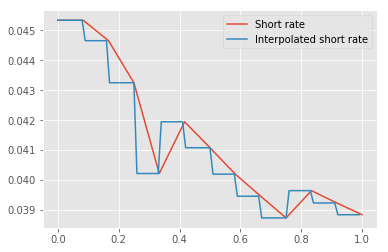

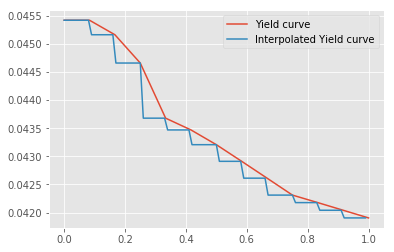

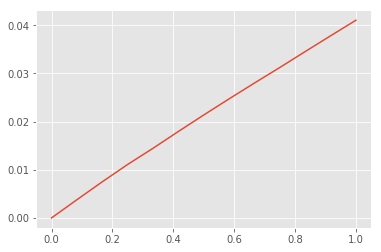

Bootstrap dividend


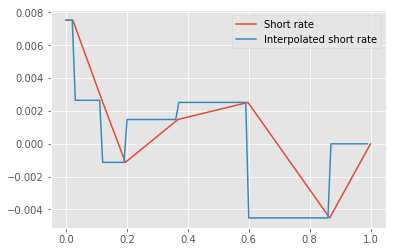

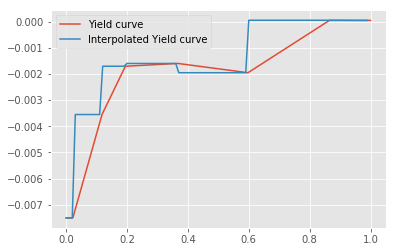

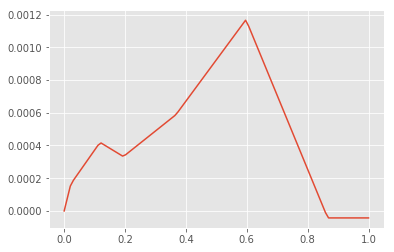

In [189]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


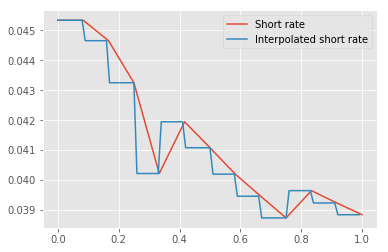

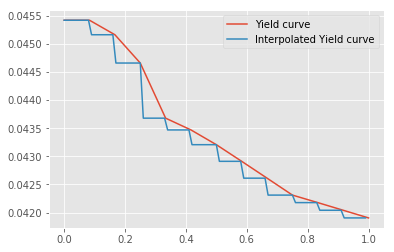

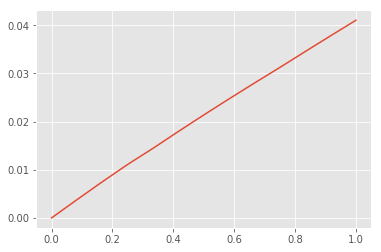

Bootstrap dividend


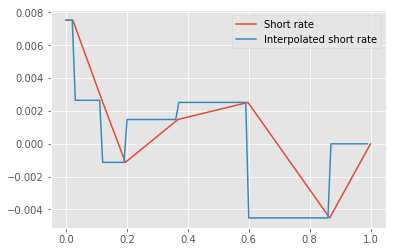

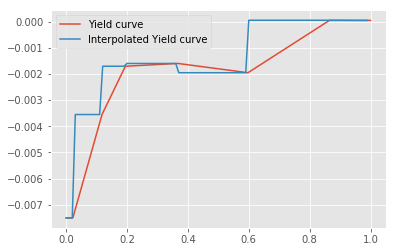

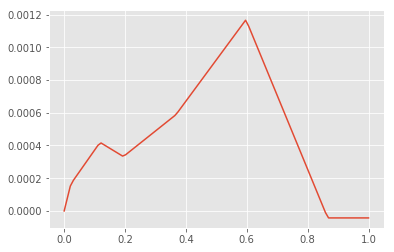

In [18]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [88]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [5]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

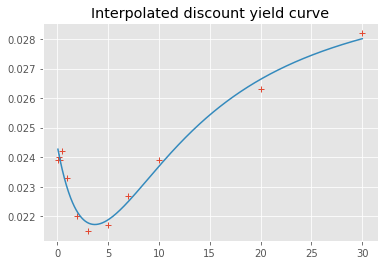

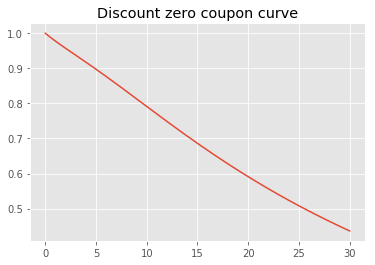

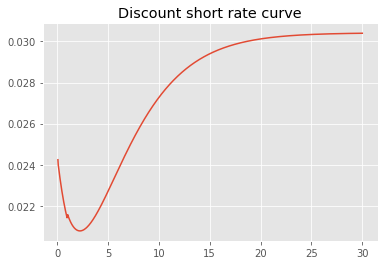

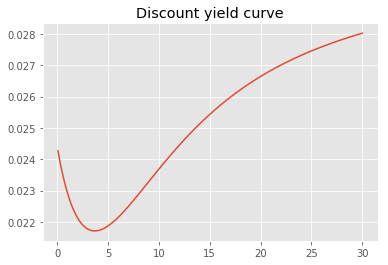

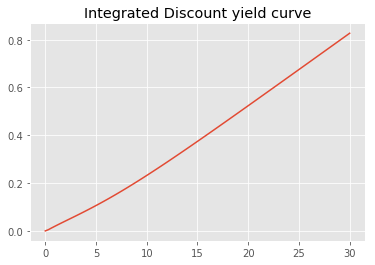

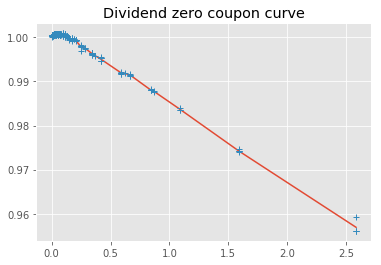

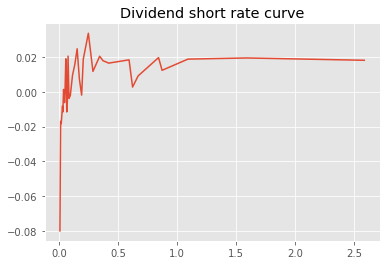

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


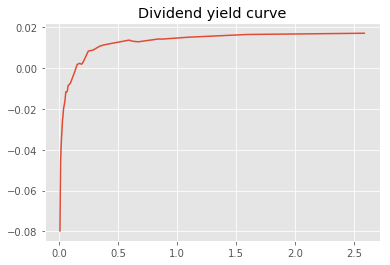

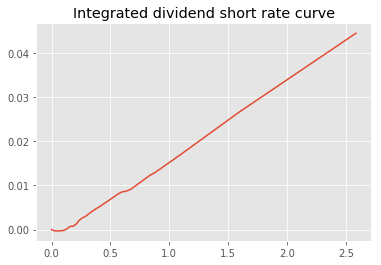

In [3]:
workingFolder = "./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [8]:
importlib.reload(bootstrapping)

<module 'dataSetConstruction' from './code/dataSetConstruction.py'>

####  Eurostoxx data

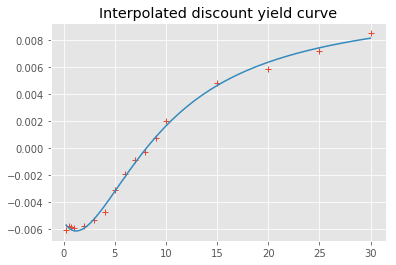

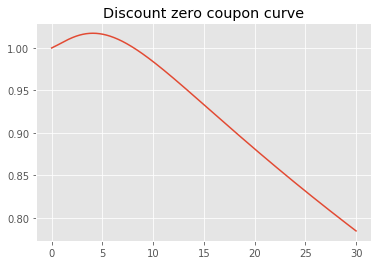

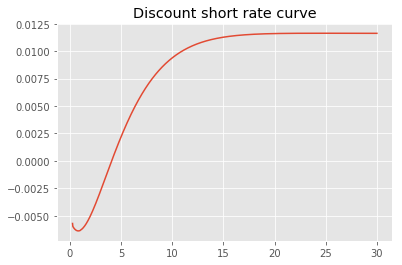

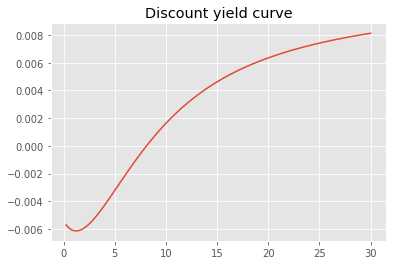

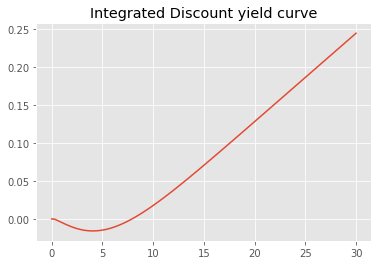

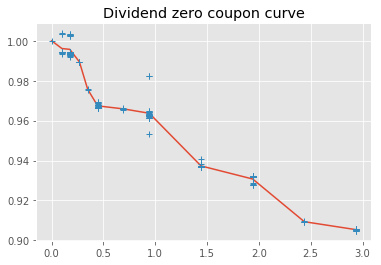

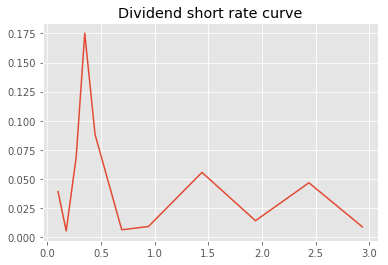

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


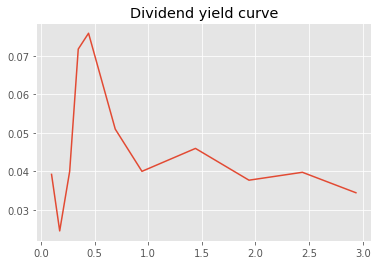

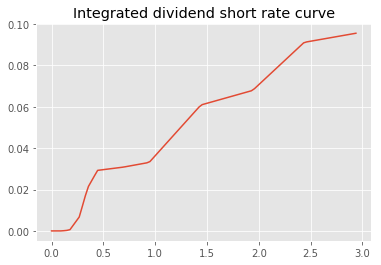

In [317]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [192]:
bootstrap.discountShortRate(10)

array(0.009402)

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [43]:
dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
                                       S0, 
                                       bootstrap)

ValueError: attempt to get argmax of an empty sequence

In [4]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
2200.0 0.419      9.95 -0.047968  184.678147      0.094049 -9.963916e-07   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052 -4.050868e-05   
       0.112      1.85 -0.018041   42.445051      0.030966 -4.102373e-05   
2400.0 0.093      1.60 -0.017779   38.199664      0.029753 -4.470370e-05   
2525.0 0.342     25.50 -0.137671  367.981139      0.248778  2.340929e-04   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.093      88.192154    2398.742294        1.000292  2400.0     0.093   
2525.0 0.342     262.508359    2519.932908        0.995921  2525.0     0.342   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2200.0 0.419         0.2586  169.246997        -1.0     -0.264678   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.093         0.2798   22.362901        -1.0     -0.175713   
2525.0 0.342         0.2100  429.765404        -1.0     -0.126425   

                 impliedTotalVariance  
Strike Maturity                        
2200.0 0.419                 0.028020  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.093                 0.007281  
2525.0 0.342                 0.015082

In [5]:
dataSetTest.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
1700.0,0.246,0.80,-0.004171,17.445534,0.009788,-0.000018,15.329284,1697.643924,0.997527,1700.0,0.246,0.4147,0.062925,-1.0,-0.521416,0.042306
2300.0,0.419,14.30,-0.069169,246.251489,0.132054,0.000036,140.724773,2294.306350,0.994628,2300.0,0.419,0.2424,261.160274,-1.0,-0.220227,0.024620
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-0.000040,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.419,20.55,-0.099289,323.155078,0.185544,0.000106,187.583551,2394.058800,0.994628,2400.0,0.419,0.2264,368.610408,-1.0,-0.177667,0.021477
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,0.000055,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907


In [6]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [7]:
dataSet.shape

(137, 15)

In [8]:
dataSetTest.shape

(142, 15)

In [9]:
S0

2859.53

In [10]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

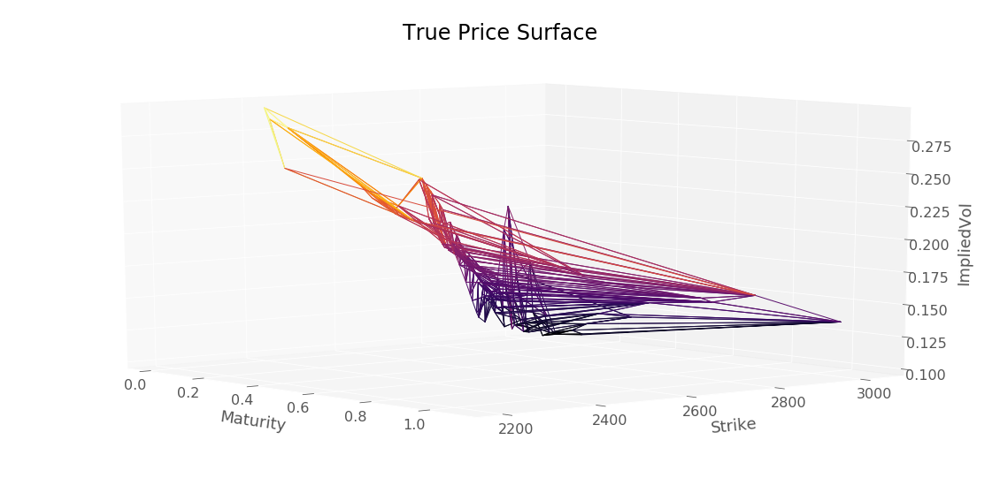

In [11]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

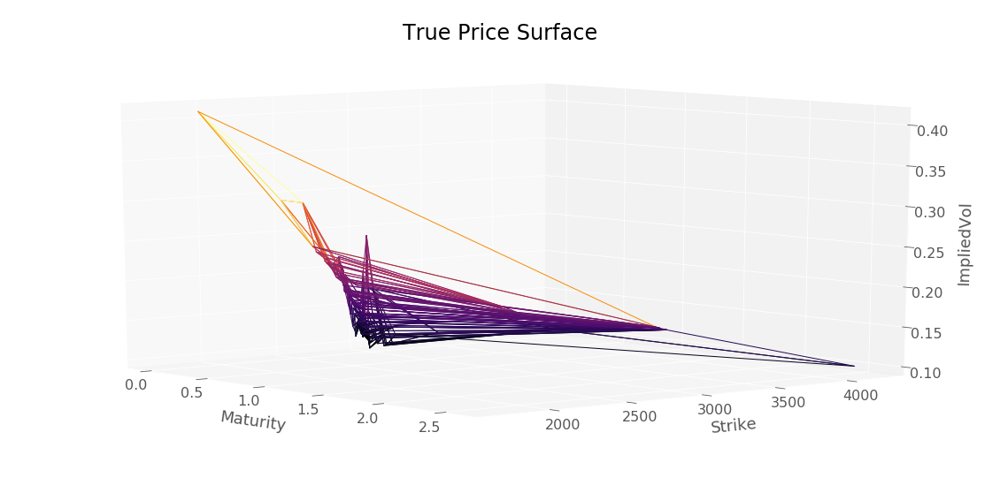

In [12]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

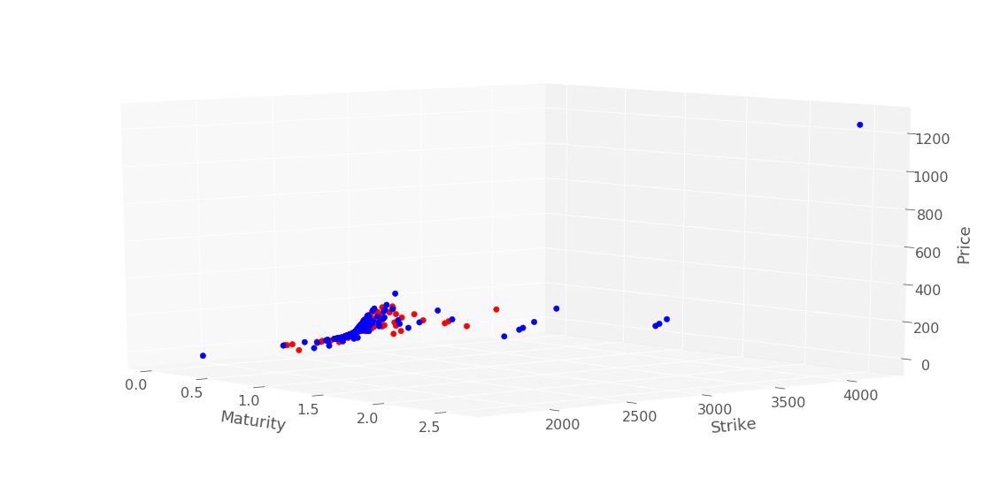

In [13]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

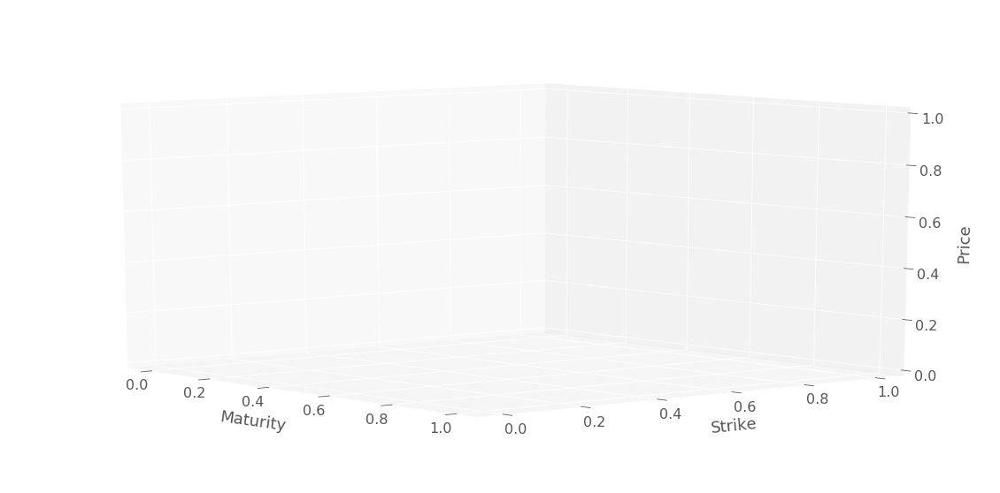

In [14]:
plotTools.plot2Series(getCall(testingSet)["Price"], 
                      getCall(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0,
                      Title = 'True Price Surface')

In [15]:
testingSet.shape

(142, 15)

In [16]:
trainingSet.shape

(137, 15)

In [17]:
dataSet.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
2200.0 0.419      9.95 -0.047968  184.678147      0.094049 -9.963916e-07   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052 -4.050868e-05   
       0.112      1.85 -0.018041   42.445051      0.030966 -4.102373e-05   
2400.0 0.093      1.60 -0.017779   38.199664      0.029753 -4.470370e-05   
2525.0 0.342     25.50 -0.137671  367.981139      0.248778  2.340929e-04   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.093      88.192154    2398.742294        1.000292  2400.0     0.093   
2525.0 0.342     262.508359    2519.932908        0.995921  2525.0     0.342   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2200.0 0.419         0.2586  169.246997        -1.0     -0.264678   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.093         0.2798   22.362901        -1.0     -0.175713   
2525.0 0.342         0.2100  429.765404        -1.0     -0.126425   

                 impliedTotalVariance  
Strike Maturity                        
2200.0 0.419                 0.028020  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.093                 0.007281  
2525.0 0.342                 0.015082

## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

$f(x) = \mu_f + s_f * f_{scaled}(x_{scaled}) $

where $x_{scaled} = \frac{x - \mu_x}{s_x}$

$\sigma(k,t) = \sqrt{2 \frac{\partial_{t} f(k,t)}{k^2 \partial_{k^2} f(k,t)}}$

$\tilde{k} = \frac{k - \mu_k}{s_k}$

$\tilde{t} = \frac{t - \mu_t}{s_t}$

$t = \mu_t + s_t * \tilde{t}$

$k = \mu_k + s_k * \tilde{k}$

$\partial_{t} f(k,t) = \partial_{t} f(\tilde{k}, \tilde{t}) = \partial_{\tilde{t}} f(\tilde{k}, \tilde{t}) \partial_{t} \tilde{t}$


In [18]:
activateScaling = False
transformCustom = dataSetConstruction.transformCustomMinMax if activateScaling else dataSetConstruction.transformCustomId
inverseTransform = dataSetConstruction.inverseTransformMinMax if activateScaling else dataSetConstruction.inverseTransformId
inverseTransformColumn = dataSetConstruction.inverseTransformColumnMinMax if activateScaling else dataSetConstruction.inverseTransformColumnId
inverseTransformColumnGreeks = dataSetConstruction.inverseTransformColumnGreeksMinMax if activateScaling else dataSetConstruction.inverseTransformColumnGreeksId

In [19]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [20]:
scaledDataSet.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
2200.0 0.419      9.95 -0.047968  184.678147      0.094049 -9.963916e-07   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052 -4.050868e-05   
       0.112      1.85 -0.018041   42.445051      0.030966 -4.102373e-05   
2400.0 0.093      1.60 -0.017779   38.199664      0.029753 -4.470370e-05   
2525.0 0.342     25.50 -0.137671  367.981139      0.248778  2.340929e-04   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.093      88.192154    2398.742294        1.000292  2400.0     0.093   
2525.0 0.342     262.508359    2519.932908        0.995921  2525.0     0.342   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2200.0 0.419         0.2586  169.246997        -1.0     -0.264678   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.093         0.2798   22.362901        -1.0     -0.175713   
2525.0 0.342         0.2100  429.765404        -1.0     -0.126425   

                 impliedTotalVariance  
Strike Maturity                        
2200.0 0.419                 0.028020  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.093                 0.007281  
2525.0 0.342                 0.015082

In [21]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

In [22]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


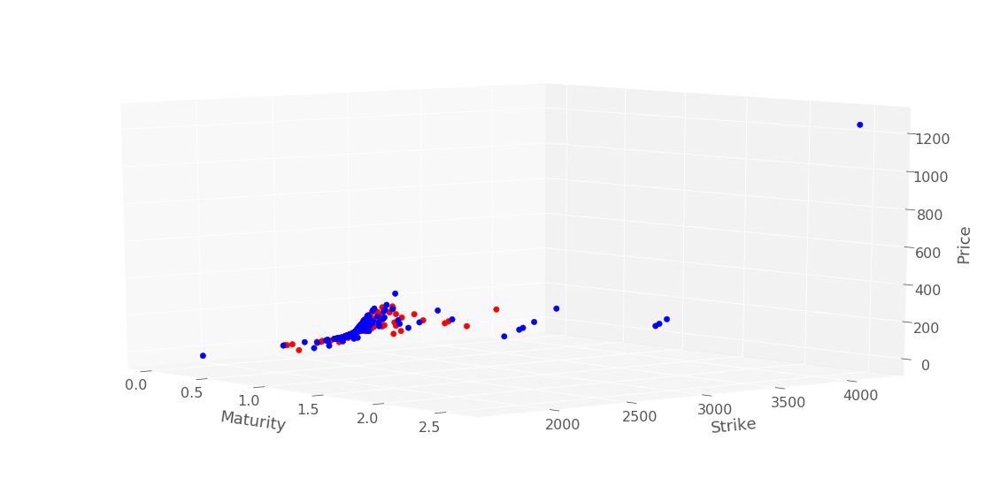

In [23]:
plotTools.plot2Series(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                      dataSet[dataSet.Maturity > 0]["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [24]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

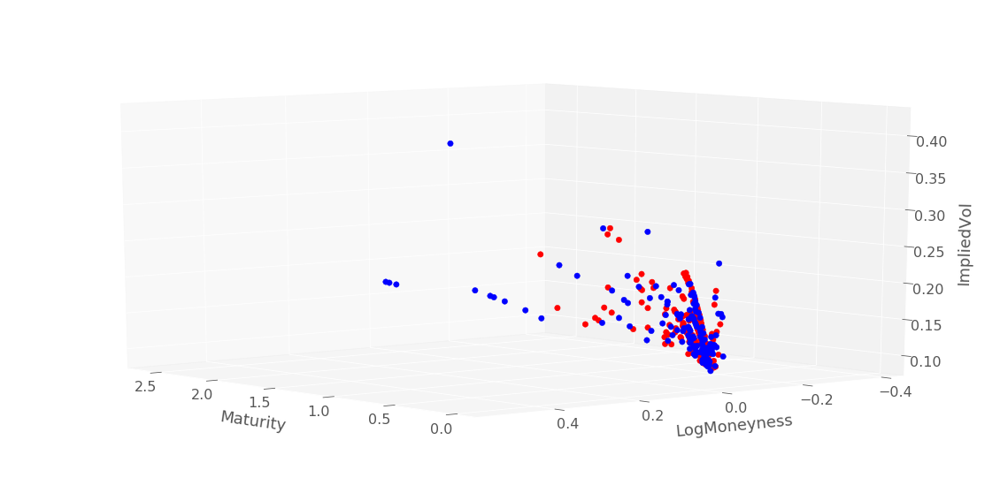

In [25]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'True Implied vol Surfaces', 
                      az=140)

In [26]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

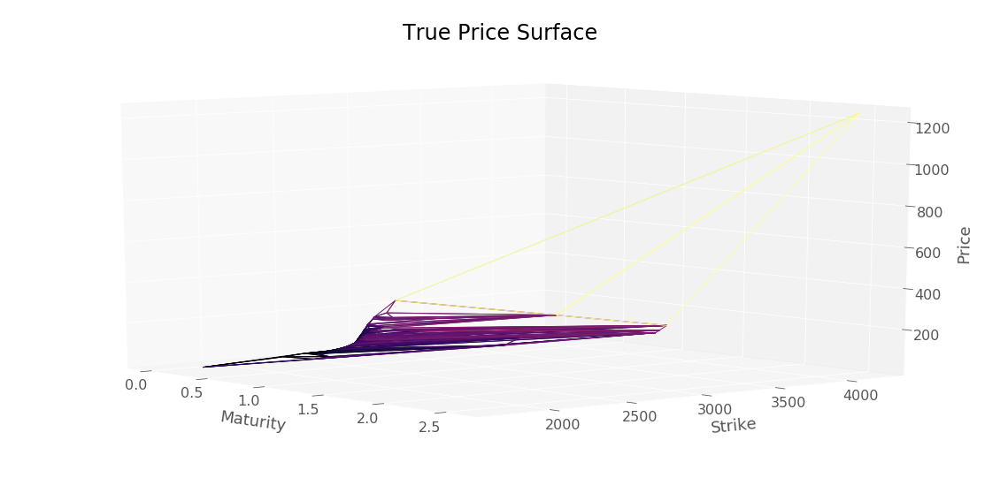

In [27]:
plotTools.plotSerie(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

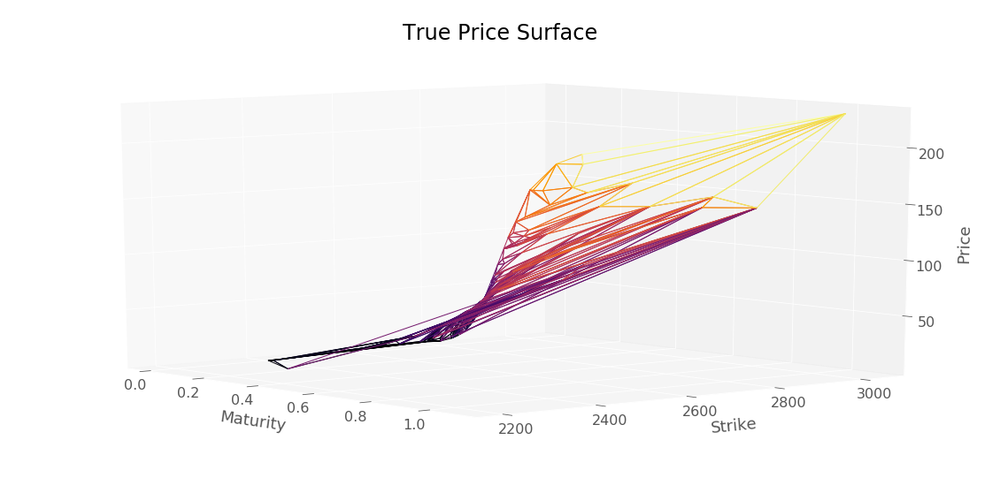

In [28]:
plotTools.plotSerie(dataSet["Price"],
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

In [29]:
inverseTransform(scaledDataSet, scaler).head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
2200.0 0.419      9.95 -0.047968  184.678147      0.094049 -9.963916e-07   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052 -4.050868e-05   
       0.112      1.85 -0.018041   42.445051      0.030966 -4.102373e-05   
2400.0 0.093      1.60 -0.017779   38.199664      0.029753 -4.470370e-05   
2525.0 0.342     25.50 -0.137671  367.981139      0.248778  2.340929e-04   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.093      88.192154    2398.742294        1.000292  2400.0     0.093   
2525.0 0.342     262.508359    2519.932908        0.995921  2525.0     0.342   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2200.0 0.419         0.2586  169.246997        -1.0     -0.264678   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.093         0.2798   22.362901        -1.0     -0.175713   
2525.0 0.342         0.2100  429.765404        -1.0     -0.126425   

                 impliedTotalVariance  
Strike Maturity                        
2200.0 0.419                 0.028020  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.093                 0.007281  
2525.0 0.342                 0.015082

In [30]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [31]:
df1 = loadData.removeDataViolatingStaticArbitrage(trainingSet)
df1.shape

(136, 15)

In [32]:
df2 = loadData.removeDataViolatingStaticArbitrage(df1)
df2.shape

(136, 15)

In [33]:
df3 = loadData.removeDataViolatingStaticArbitrage(df2)
df3.shape

(136, 15)

### Implied volatility function calibration by bissection

Strike :  2900.0  NbViolations :  1
0.342    False
0.591     True
dtype: bool
0.011    0.000125
0.342    0.006176
0.591    0.005604
dtype: float64


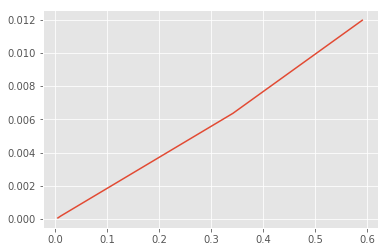

In [34]:
for strike in dataSet.rename({"Strike" : "StrikeColumn"}, axis=1).groupby("StrikeColumn"):
    impliedTotVariance = np.square(strike[1]["ImpliedVol"]) * strike[1]["Maturity"]
    sortedStrike = pd.Series(impliedTotVariance.values, 
                             index  = strike[1]["Maturity"].values).sort_index().diff().dropna()
    thetaViolation = sortedStrike.diff().dropna()
    if (thetaViolation < 0).sum() > 0 :
        plt.plot(strike[1]["Maturity"].values, impliedTotVariance.values, label = str(strike[0]))
        print("Strike : ", strike[0], " NbViolations : ", (thetaViolation < 0).sum())
        print((thetaViolation < 0))
        print(sortedStrike)

In [119]:
%matplotlib inline

In [120]:
360 * 0.093

33.48

# SSVI Model

In [35]:
import SSVI


In [36]:
np.seterr(all='warn')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [37]:
dataSet = dataSet[dataSet["Maturity"] > 0]
dataSetTest = dataSetTest[dataSetTest["Maturity"] > 0]


In [38]:
dataSet.columns

Index(['Price', 'Delta', 'Vega', 'Delta Strike', 'Gamma Strike', 'Theta',
       'ChangedStrike', 'DividendFactor', 'Strike', 'Maturity', 'ImpliedVol',
       'VegaRef', 'OptionType', 'logMoneyness', 'impliedTotalVariance'],
      dtype='object')

In [39]:
importlib.reload(SSVI)

<module 'SSVI' from './code/SSVI.py'>

In [40]:
#parameters, theta, maturities, pSSVI = SSVI.train_svi_surface(dataSet, S0)
SSVIModel = SSVI.SSVIModel(S0, bootstrap)
SSVIModel.fit(dataSet)

Parameters of SSVI model :  [-0.81724403  0.84417407  0.5       ]
time step 23  :  1.09
time step 22  :  0.841
time step 21  :  0.591
time step 20  :  0.419


./code/SSVI.py:612: RuntimeWarning: invalid value encountered in sqrt
  alpha = np.sign(beta) * np.sqrt(1 / beta ** 2 - 1)
./code/SSVI.py:319: RuntimeWarning: invalid value encountered in less
  if any(model_total_implied_variance < before_total_implied_variance) :
./code/SSVI.py:326: RuntimeWarning: invalid value encountered in greater
  if any(model_total_implied_variance > after_total_implied_variance) :


time step 19  :  0.342


./code/SSVI.py:614: RuntimeWarning: invalid value encountered in sqrt
  (b * (-rho + np.sign(alpha) * np.sqrt(1 + alpha ** 2) - alpha * np.sqrt(1 - rho ** 2))))
./code/SSVI.py:625: RuntimeWarning: invalid value encountered in sqrt
  a = vt * tau - b * sigma * np.sqrt(1 - rho ** 2)


time step 18  :  0.285
time step 17  :  0.246
time step 16  :  0.203
time step 15  :  0.189
time step 14  :  0.17
time step 13  :  0.151
time step 12  :  0.131
time step 11  :  0.112
time step 10  :  0.093
time step 9  :  0.074
time step 8  :  0.063
time step 7  :  0.055
time step 6  :  0.044
time step 5  :  0.036
time step 4  :  0.03
time step 3  :  0.027
time step 2  :  0.016
time step 1  :  0.011
time step 0  :  0.005


In [41]:
serie = SSVIModel.eval(dataSetTest)

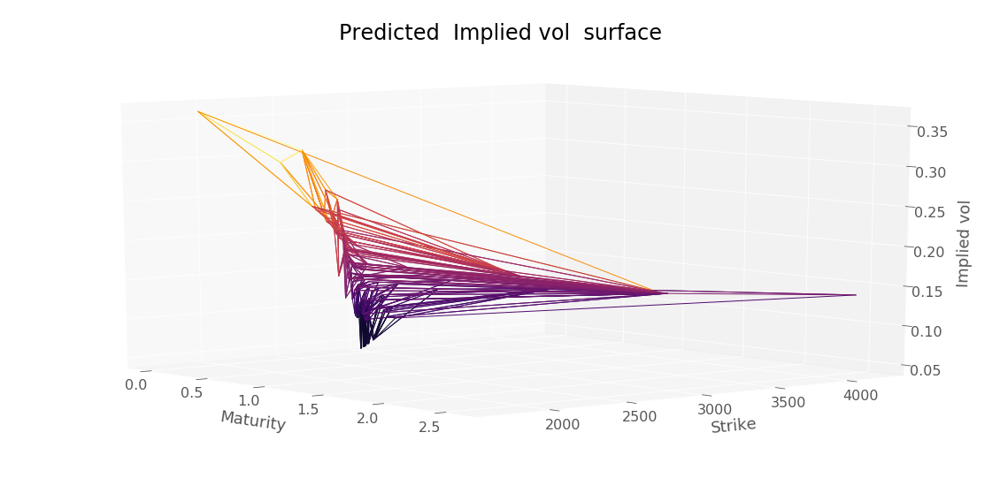

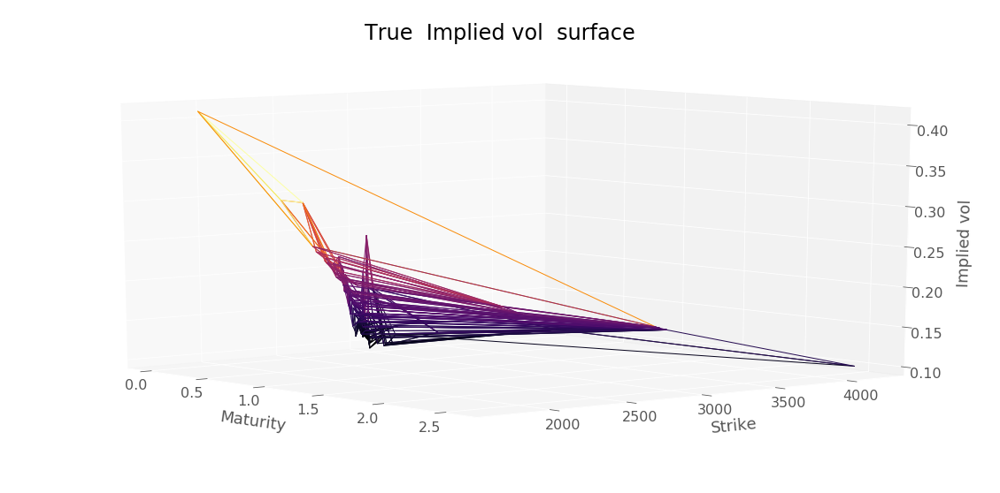

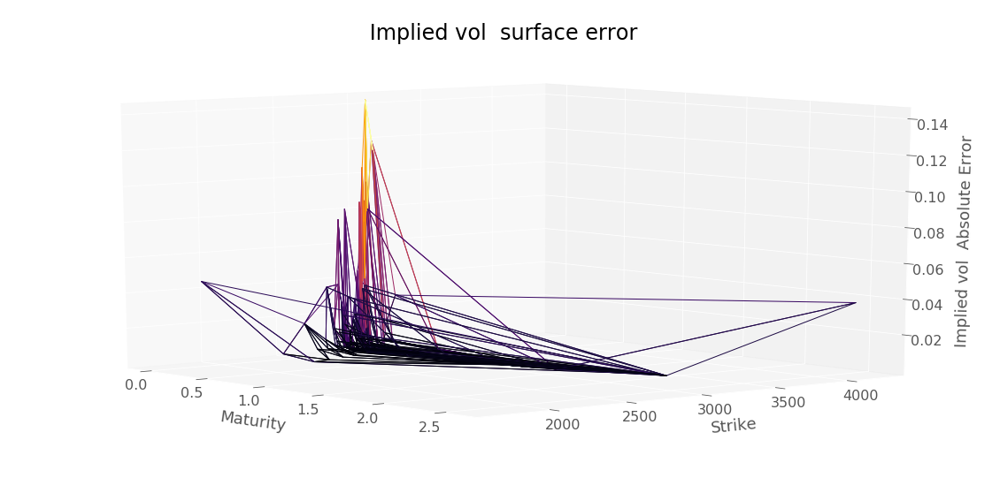

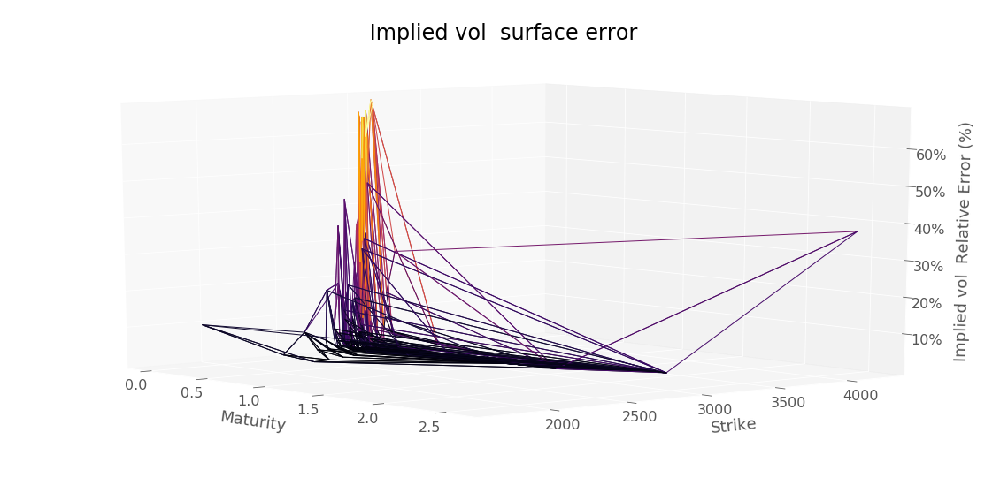

RMSE :  0.03480520639517139


In [42]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

In [43]:
SSVIModel.theta

array([9.92168982e-05, 2.89964396e-04, 4.40201539e-04, 1.59337688e-04,
       6.62570310e-04, 8.31182323e-04, 9.48056113e-04, 1.18270068e-03,
       7.99788315e-04, 1.51831046e-03, 1.89988365e-03, 2.30256311e-03,
       2.65284372e-03, 3.55628722e-03, 3.47317818e-03, 3.85922235e-03,
       4.13251908e-03, 5.21420971e-03, 5.89771838e-03, 7.12133810e-03,
       8.88657884e-03, 1.29041378e-02, 1.89336972e-02, 2.57710925e-02])

In [44]:
SSVIModel.maturities

array([0.005, 0.011, 0.016, 0.027, 0.03 , 0.036, 0.044, 0.055, 0.063,
       0.074, 0.093, 0.112, 0.131, 0.151, 0.17 , 0.189, 0.203, 0.246,
       0.285, 0.342, 0.419, 0.591, 0.841, 1.09 ])

In [45]:
SSVIModel.forward_theta

array([2859.53      , 2859.82165476, 2860.08421196, 2860.34511199,
       2860.44453937, 2860.422368  , 2860.56580578, 2860.21056348,
       2860.47660318, 2860.20868774, 2861.02930535, 2861.81590935,
       2862.27434955, 2862.23165804, 2863.13237726, 2864.52719273,
       2864.7281759 , 2863.4986006 , 2864.81062992, 2865.27995551,
       2866.6263338 , 2868.76286197, 2873.40461311, 2876.01428498])

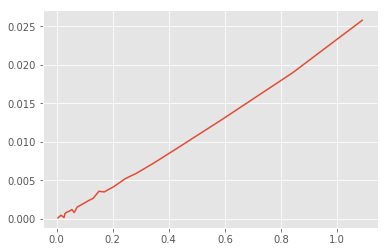

In [46]:
plt.plot(SSVIModel.maturities, SSVIModel.theta)#np.sqrt(theta/maturities))#theta)

In [87]:
SSVIModel.theta

array([9.92168982e-05, 2.89964396e-04, 4.40201539e-04, 1.59337688e-04,
       6.62570310e-04, 8.31182323e-04, 9.48056113e-04, 1.18270068e-03,
       7.99788315e-04, 1.51831046e-03, 1.89988365e-03, 2.30256311e-03,
       2.65284372e-03, 3.55628722e-03, 3.47317818e-03, 3.85922235e-03,
       4.13251908e-03, 5.21420971e-03, 5.89771838e-03, 7.12133810e-03,
       8.88657884e-03, 1.29041378e-02, 1.89336972e-02, 2.57710925e-02])

In [47]:

serieDf = SSVIModel.eval(dataSetTest)

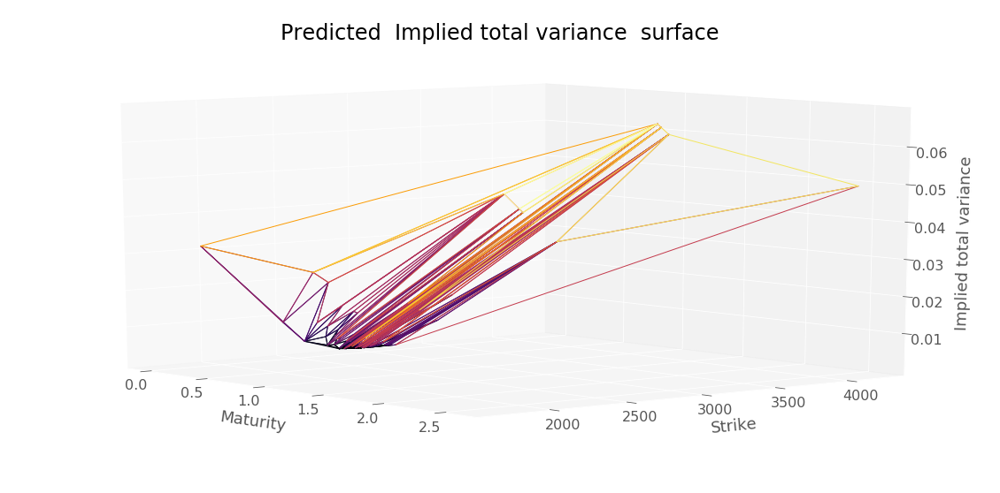

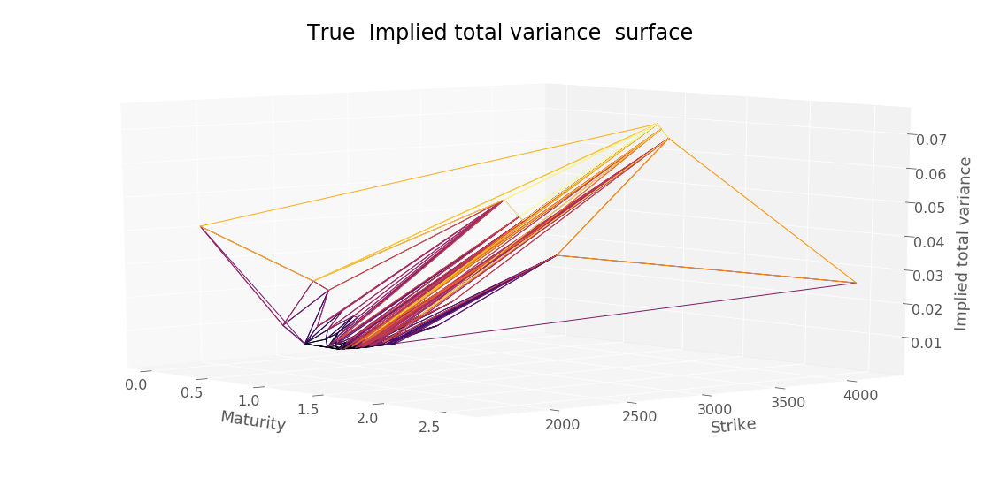

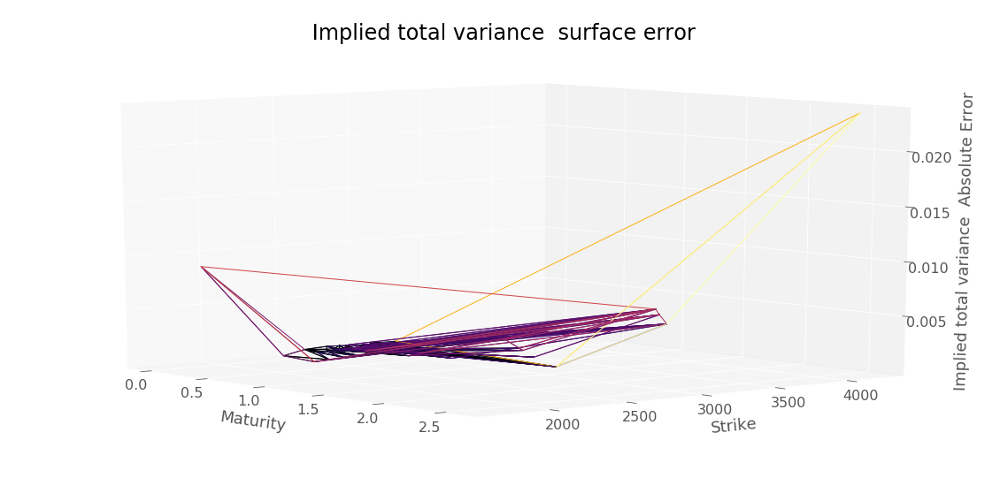

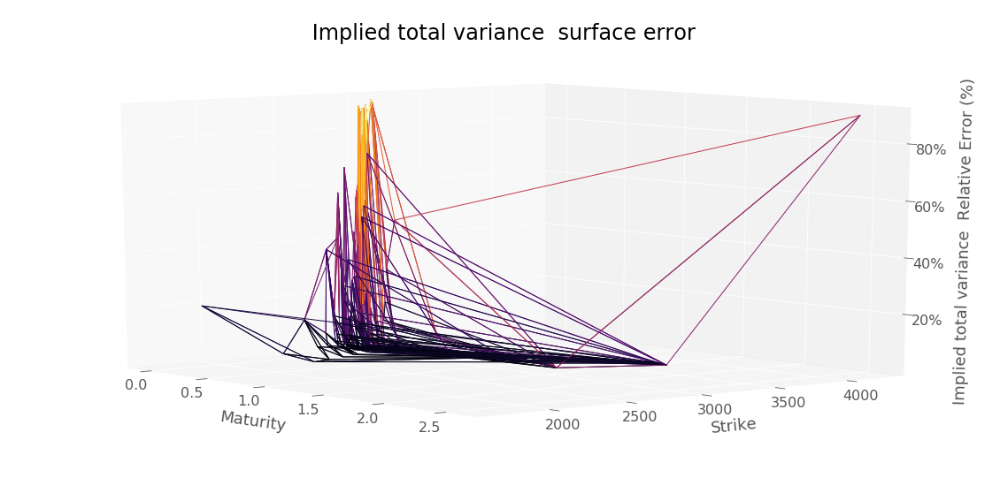

RMSE :  0.0023662959996685116


In [48]:
plotTools.predictionDiagnosis(SSVI.impliedVariance(serieDf), 
                              SSVI.impliedVariance(dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"]), 
                              " Implied total variance ", 
                              yMin=KMin, 
                              yMax=KMax)

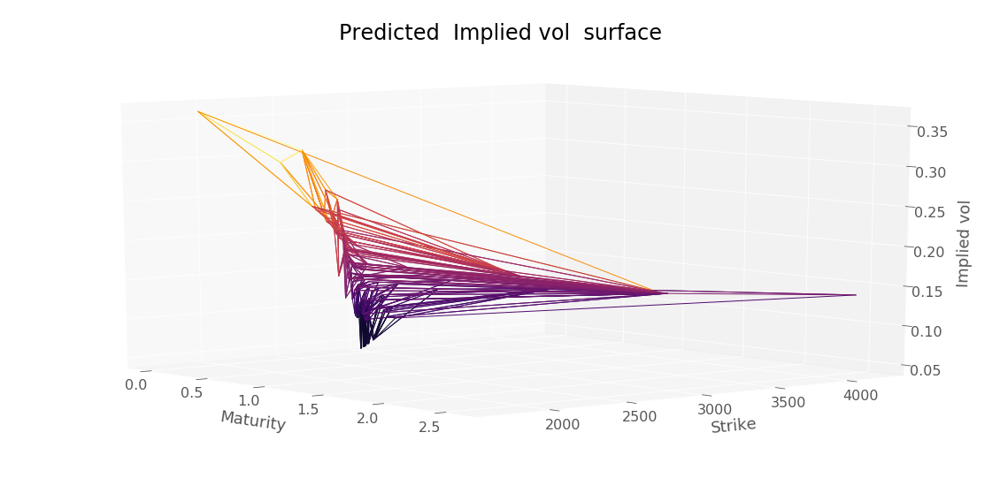

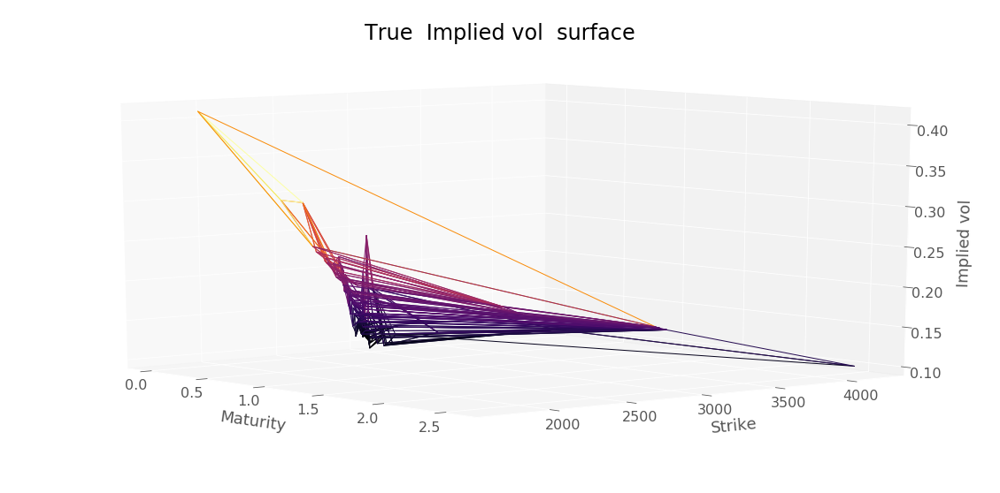

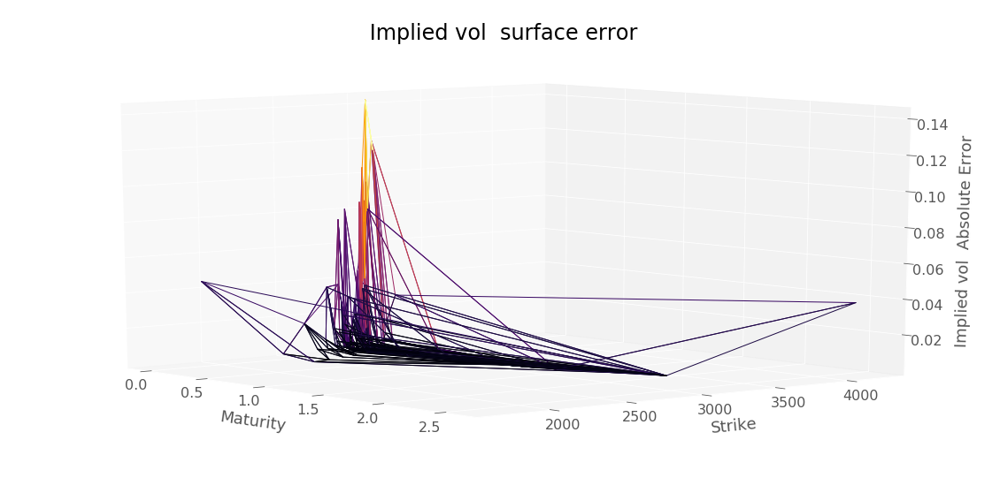

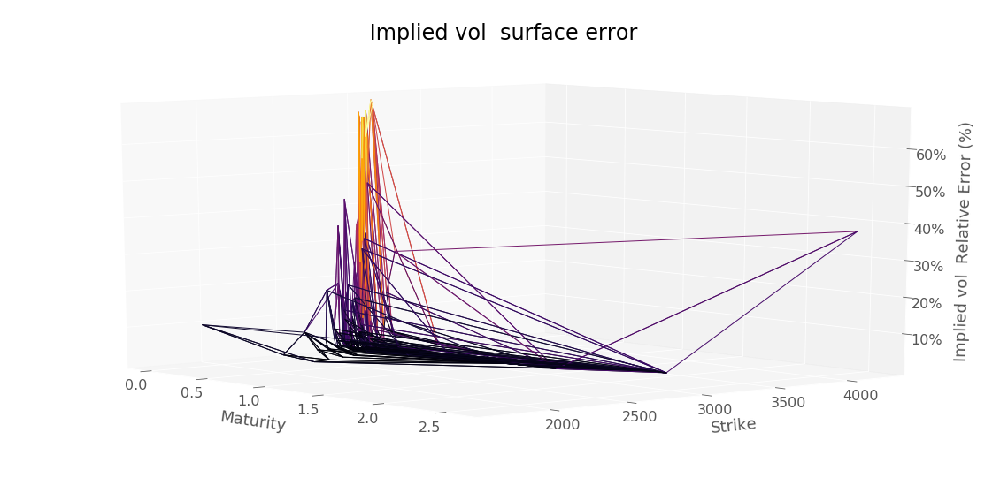

RMSE :  0.03480520639517139


In [49]:
plotTools.predictionDiagnosis(serieDf, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin, 
                              yMax=KMax)

In [50]:
dataSet.head(20)

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                             
2200.0 0.419      9.950 -0.047968  184.678147      0.094049 -9.963916e-07   
2350.0 0.093      1.200 -0.013019   29.227795      0.022052 -4.050868e-05   
       0.112      1.850 -0.018041   42.445051      0.030966 -4.102373e-05   
2400.0 0.093      1.600 -0.017779   38.199664      0.029753 -4.470370e-05   
2525.0 0.342     25.500 -0.137671  367.981139      0.248778  2.340929e-04   
2550.0 0.112      6.250 -0.063439  119.069171      0.105505  2.644124e-05   
       0.151      9.800 -0.084634  172.349631      0.143771  8.937826e-05   
2590.0 0.170     14.200 -0.115349  229.343638      0.197289  2.024247e-04   
2600.0 0.093      6.200 -0.072646  120.470010      0.118935  5.902055e-05   
       0.170     15.050 -0.122026  238.644663      0.208757  2.312729e-04   
2625.0 0.112     10.400 -0.105018  174.035016      0.174797  1.863909e-04   
2660.0 0.246     31.550 -0.202896  400.500427      0.357198  5.773046e-04   
2675.0 0.044      3.450 -0.063038   74.262589      0.098522  3.151244e-05   
2700.0 0.246     37.900 -0.242136  443.034361      0.428115  8.073718e-04   
       0.591     78.450 -0.302331  767.005036      0.564019  8.194175e-04   
2725.0 0.131     24.250 -0.218669  305.382561      0.374104  8.786477e-04   
2740.0 0.016      2.650 -0.069094   48.080410      0.105257  8.032883e-05   
2745.0 0.093     20.050 -0.218509  257.197870      0.369026  1.025373e-03   
2750.0 0.011      1.475 -0.052310   32.063377      0.078070 -2.721145e-05   
       0.016      3.250 -0.083591   55.582765      0.128289  1.926001e-04   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.093      88.192154    2398.742294        1.000292  2400.0     0.093   
2525.0 0.342     262.508359    2519.932908        0.995921  2525.0     0.342   
2550.0 0.112     246.324015    2547.963157        1.000111  2550.0     0.112   
       0.151     270.205079    2547.593057        0.999325  2550.0     0.151   
2590.0 0.170     322.882165    2586.741276        0.999189  2590.0     0.170   
2600.0 0.093     300.345988    2598.637486        1.000292  2600.0     0.093   
       0.170     336.543352    2596.728694        0.999189  2600.0     0.170   
2625.0 0.112     368.999408    2622.903250        1.000111  2625.0     0.112   
2660.0 0.246     389.390478    2656.313434        0.997527  2660.0     0.246   
2675.0 0.044     379.560152    2674.031387        1.000362  2675.0     0.044   
2700.0 0.246     420.194878    2696.257997        0.997527  2700.0     0.246   
       0.591     285.721587    2691.310287        0.991511  2700.0     0.591   
2725.0 0.131     547.004714    2722.387269        0.999817  2725.0     0.131   
2740.0 0.016     693.952458    2739.469057        1.000194  2740.0     0.016   
2745.0 0.093     648.453463    2743.561499        1.000292  2745.0     0.093   
2750.0 0.011     654.996699    2749.719545        1.000102  2750.0     0.011   
       0.016     813.870922    2749.467120        1.000194  2750.0     0.016   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2200.0 0.419         0.2586  169.246997        -1.0     -0.264678   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.093         0.2798   22.362901        -1.0     -0.175713   
2525.0 0.342         0.2100  429.765404        -1.0     -0.126425   
2550.0 0.112         0.2317  139.166804        -1.0     -0.115363   
       0.1

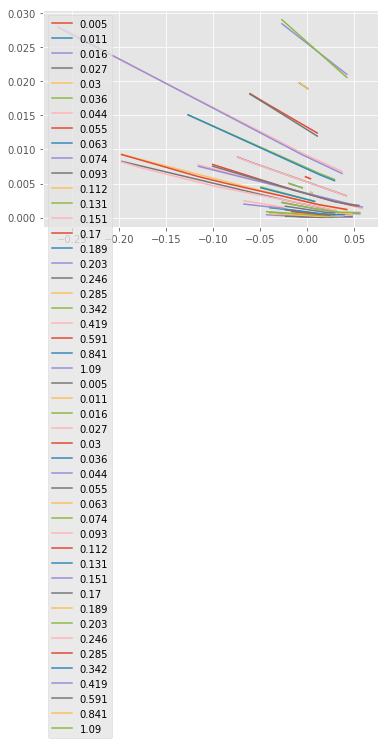

In [51]:
#interpolationBind = lambda x : SSVI.interpolateGrid(x, parameters, 
#                                                    theta, 
#                                                    maturities, 
#                                                    interestrate_theta,
#                                                    forward_theta,
#                                                    S0,
#                                                    bootstrap)
interpolationBind = lambda x : SSVIModel.eval(x)
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plotTools.plotEachSmile(dataSet)
plt.show()

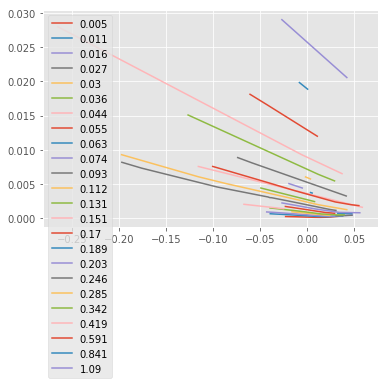

In [52]:
plotTools.plotEachSmile(dataSet)
plt.show()

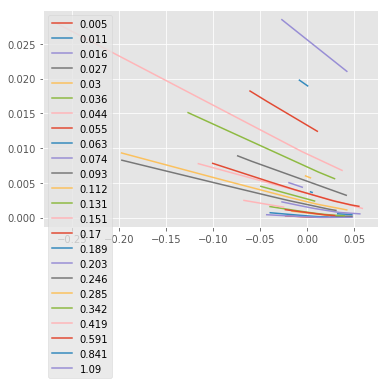

In [53]:
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plt.show()

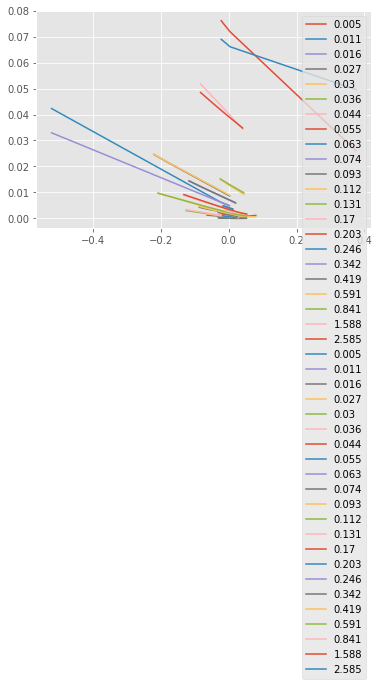

In [54]:
plotTools.plotEachSmile(dataSetTest)
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [55]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

In [56]:
s = dataSet[dataSet["Strike"]<=3000]["Strike"].max()
s

3000.0

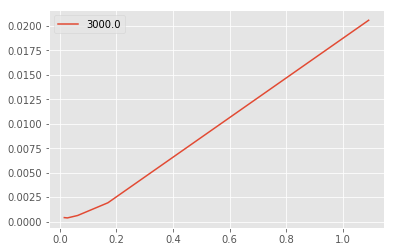

In [57]:
plotTools.plotEachStrike(dataSet[dataSet["Strike"]==s])

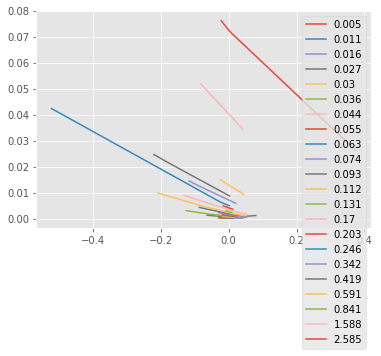

In [58]:
plotTools.plotEachSmile(dataSetTest)
plt.show()

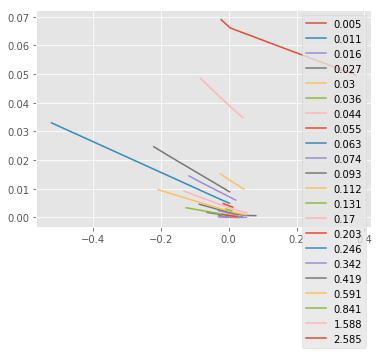

In [59]:
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [83]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, interpolationBind)

./code/SSVI.py:1075: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


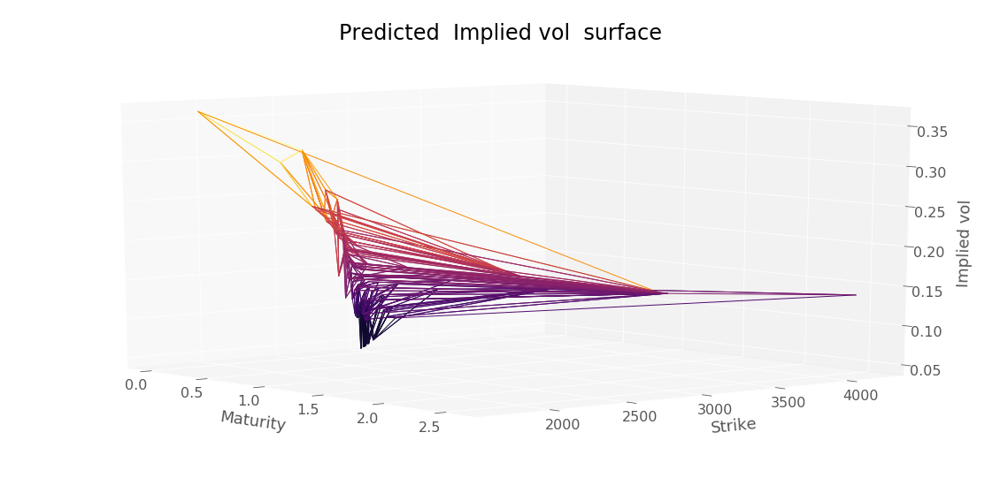

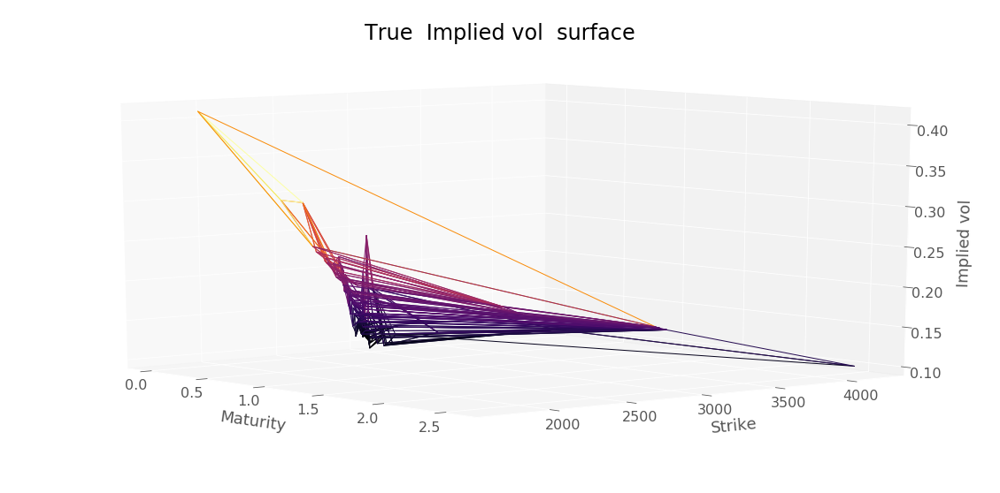

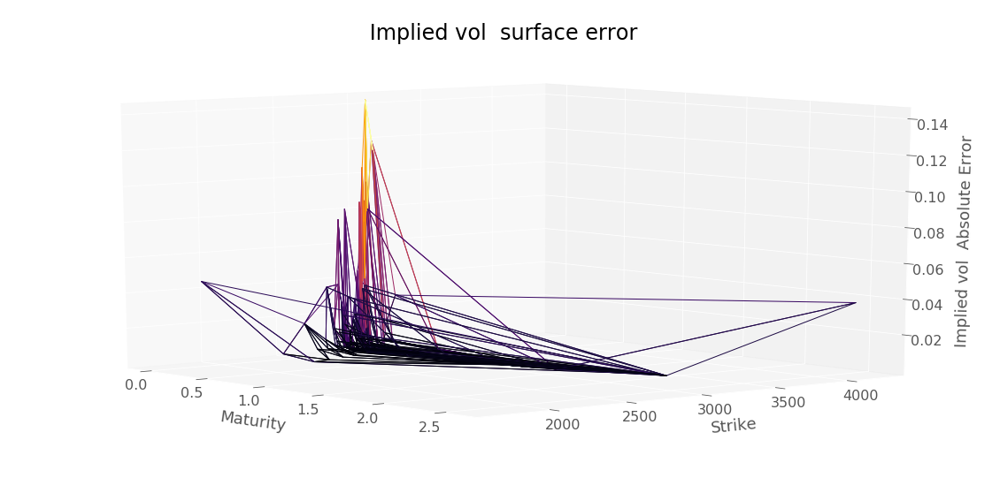

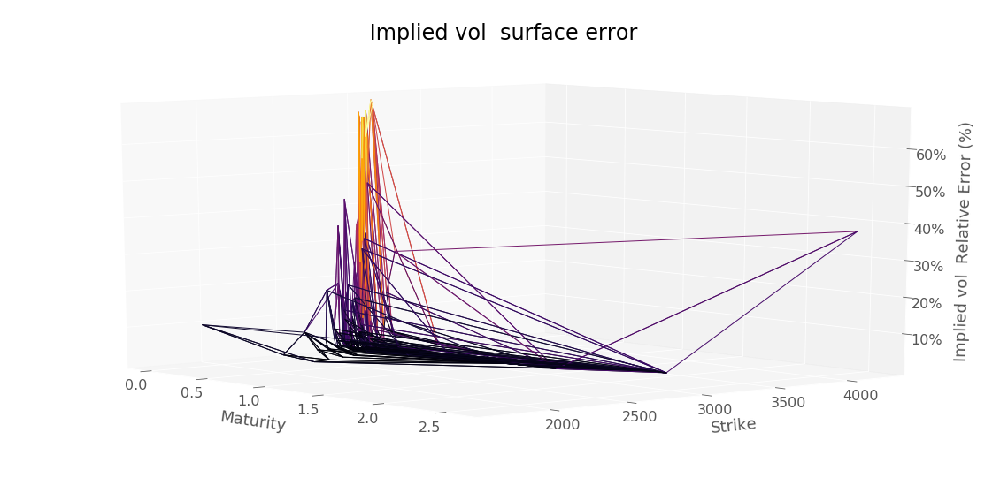

RMSE :  0.03480520639517139


In [84]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest["ImpliedVol"], 
                              " Implied vol ",
                              yMin=KMin, 
                              yMax=KMax)

In [85]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

Number of arbitrage violations :  12
Arbitrable volatility :  Strike  Maturity
2775.0  0.016       0.2160
2820.0  0.016       0.1926
2920.0  0.016       0.1280
2925.0  0.016       0.1244
2940.0  0.016       0.1225
2945.0  0.016       0.1286
2950.0  0.016       0.1193
2955.0  0.016       0.1318
2970.0  0.016       0.1444
2975.0  0.016       0.1282
3005.0  0.016       0.1726
3015.0  0.016       0.1682
Name: ImpliedVol, dtype: float64
Interpolated Arbitrable volatility :  Strike  Maturity
2775.0  0.016       0.140424
2820.0  0.016       0.111001
2920.0  0.016       0.043149
2925.0  0.016       0.043346
2940.0  0.016       0.044575
2945.0  0.016       0.045105
2950.0  0.016       0.045670
2955.0  0.016       0.046259
2970.0  0.016       0.048107
2975.0  0.016       0.048737
3005.0  0.016       0.052516
3015.0  0.016       0.053751
dtype: float64


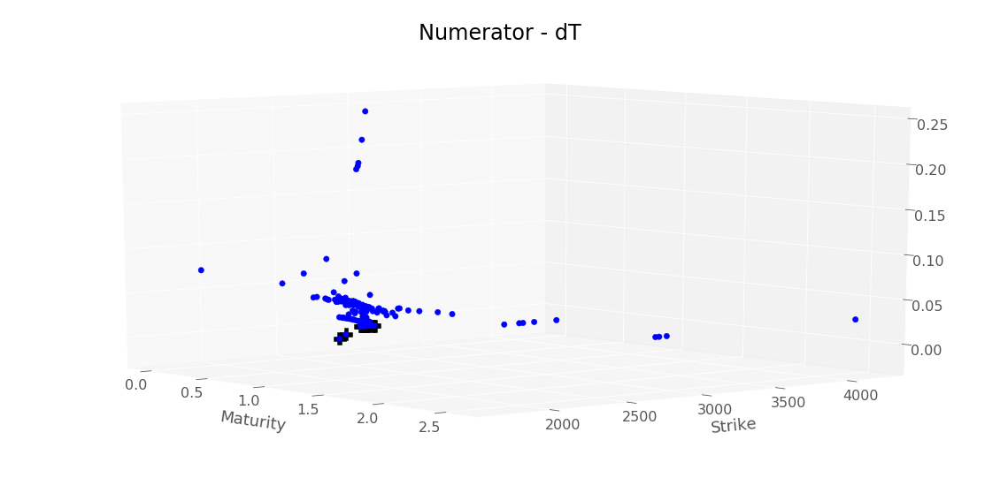

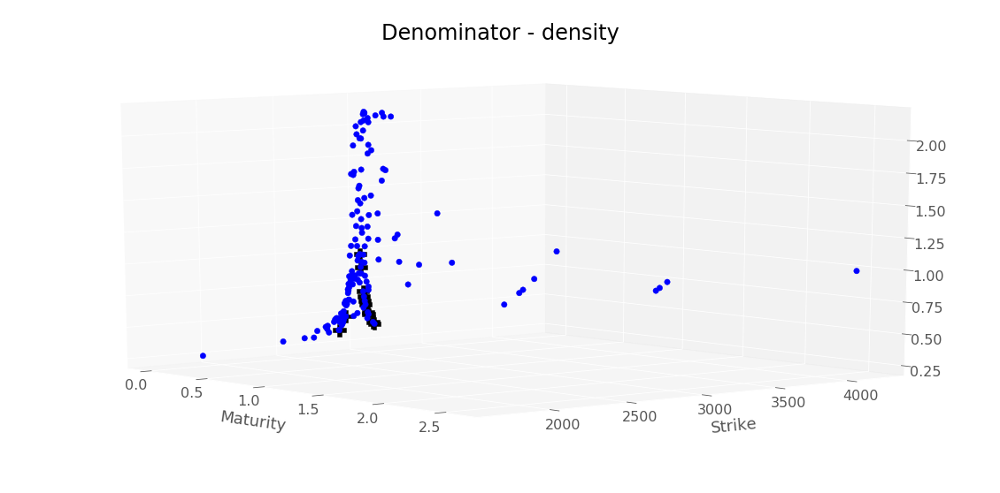

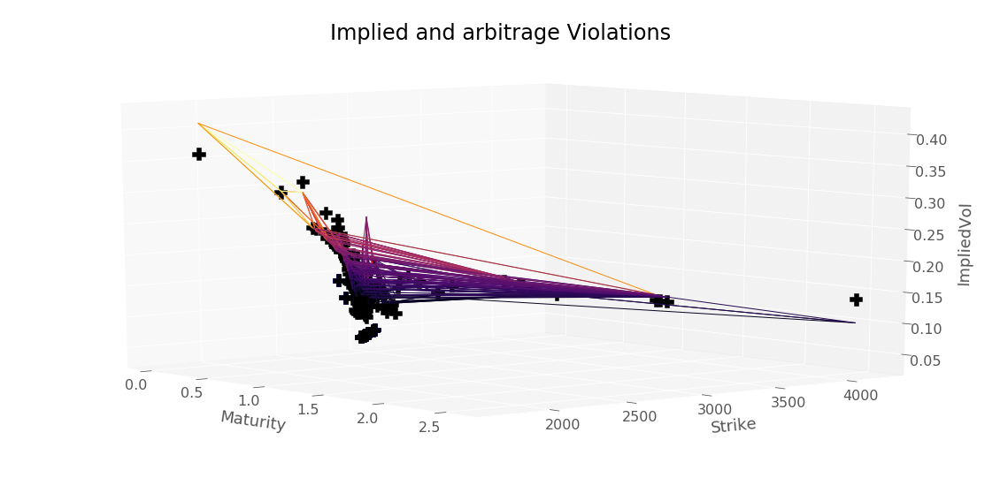

/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


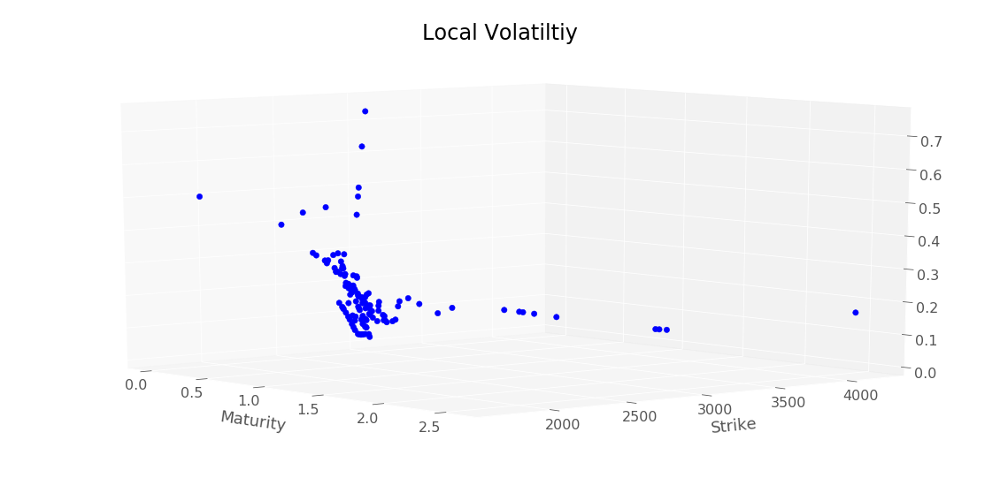

In [86]:
plotTools.diagnoseLocalVol(dT,
                           locVolSSVI,
                           density,
                           interpolationBind(dataSetTest),
                           dataSetTest,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

#### Evaluate local volatility on gp local volatility grid

In [98]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [99]:
kernel = "Matern" #"Gaussian"
workingFolder = "./data/09082001/"
locVolAreskyFormatted = loadData.loadGPLocVol(workingFolder, kernel, bootstrap, S0)

Loading local volatility from :  ./data/09082001/local_vol_matern_5_2.csv


In [109]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20          0.20  4171.929  0.200000         0.387651  
         0.24          0.24  4171.929  0.239895         0.405029  
         0.28          0.28  4171.929  0.279789         0.421496  
         0.32          0.32  4171.929  0.319684         0.432692  
         0.36          0.36  4171.929  0.359579         0.438045

In [110]:
locVolAreskyFormatted.shape

(171, 8)

In [111]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20          0.20  4171.929  0.200000         0.387651  
         0.24          0.24  4171.929  0.239895         0.405029  
         0.28          0.28  4171.929  0.279789         0.421496  
         0.32          0.32  4171.929  0.319684         0.432692  
         0.36          0.36  4171.929  0.359579         0.438045

In [112]:
locVolAreskyFormatted.drop_duplicates().shape

(171, 8)

In [113]:
locVolAreskyFormatted.index.unique().shape

(171,)

In [114]:
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(locVolAreskyFormatted, 
                                                           interpolationBind)

./code/SSVI.py:1019: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


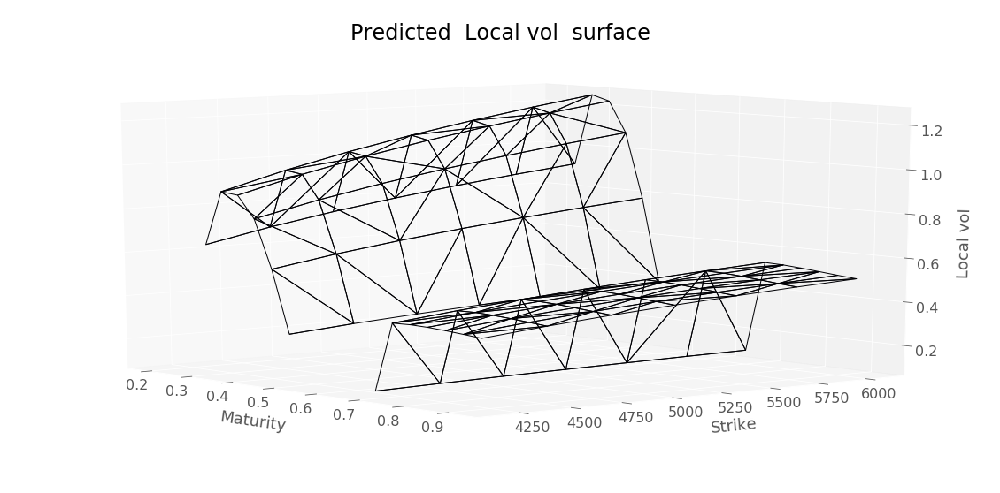

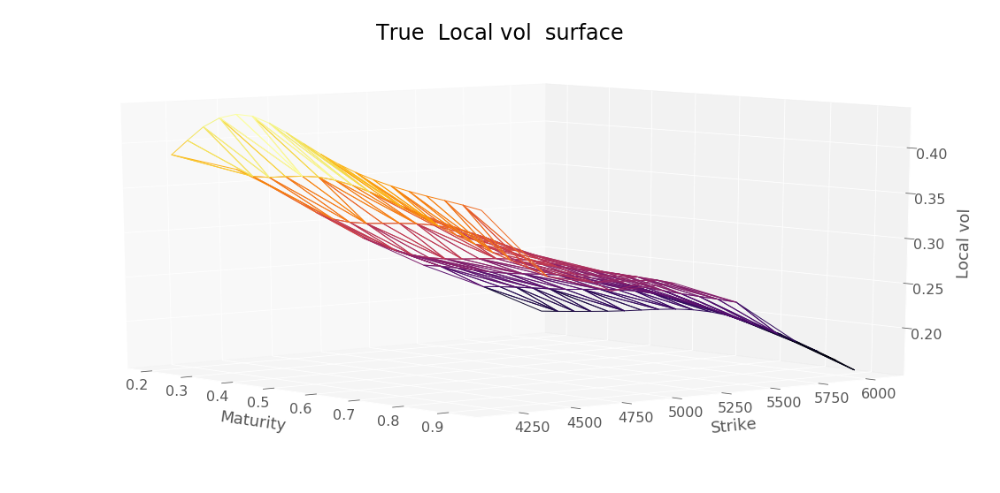

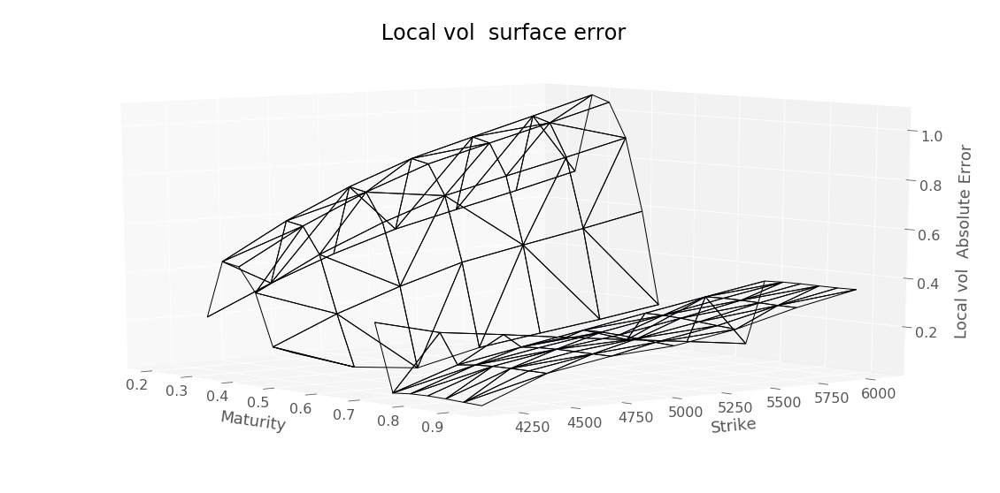

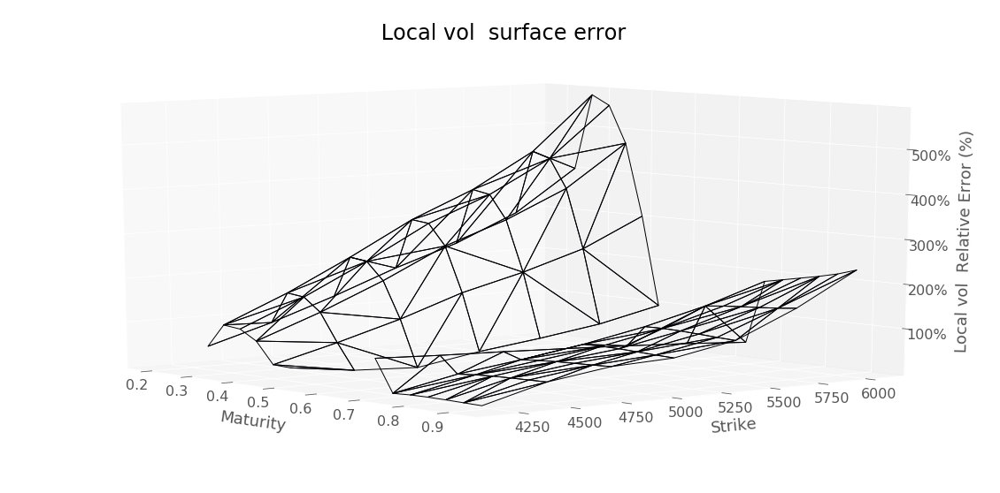

RMSE :  0.5020172106374904


In [115]:
plotTools.predictionDiagnosis(locVolSSVI, 
                              locVolAreskyFormatted["LocalVolatility"], 
                              " Local vol ", 
                              yMin=KMin,
                              yMax=KMax)

In [116]:
dataSet["Maturity"].unique()

array([0.942, 0.099, 0.175, 0.444, 1.441, 1.94 , 0.693, 0.268, 0.348])

In [117]:
#Maturity < 2
#K entr 70% et 130% de S0
#50 points pour le training set
#quasi-Aléatoire 

#Prix de call, taux zero coupon, puis parité call put

#Colonne mid, bid, ask, filtrer volume positif 

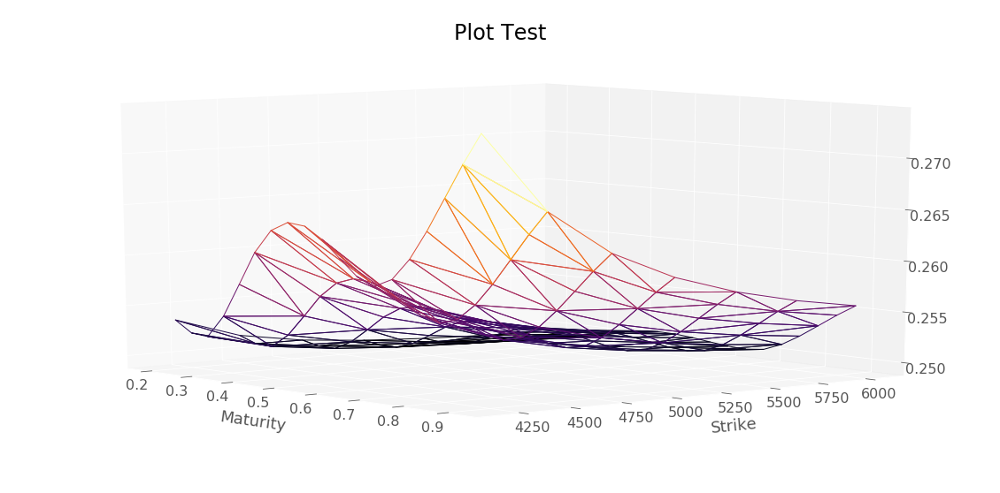

In [118]:
plotTools.plotSerie(density,
                    Title = 'Plot Test',
                    az=320,
                    yMin=KMin,
                    yMax=KMax)

In [119]:
locVolSSVIDf = locVolAreskyFormatted.copy(deep=True)
locVolSSVIDf["LocalVolatility"] = locVolSSVI

In [120]:
locVolSSVIDf.tail()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
6678.561 0.759           -1.0      0.811763    6913.792837  6678.561   
         0.798           -1.0      0.812381    6918.066551  6678.561   
         0.838           -1.0      0.812999    6922.343450  6678.561   
         0.878           -1.0      0.813616    6926.621146  6678.561   
         0.918           -1.0      0.814234    6930.899637  6678.561   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
6678.561 0.759        0.759  6678.561  0.758526         0.563982  
         0.798        0.798  6678.561  0.798421         0.556906  
         0.838        0.838  6678.561  0.838316         0.548042  
         0.878        0.878  6678.561  0.878211         0.539424  
         0.918        0.918  6678.561  0.918105         0.532265

In [122]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20          0.20  4171.929  0.200000         0.387651  
         0.24          0.24  4171.929  0.239895         0.405029  
         0.28          0.28  4171.929  0.279789         0.421496  
         0.32          0.32  4171.929  0.319684         0.432692  
         0.36          0.36  4171.929  0.359579         0.438045

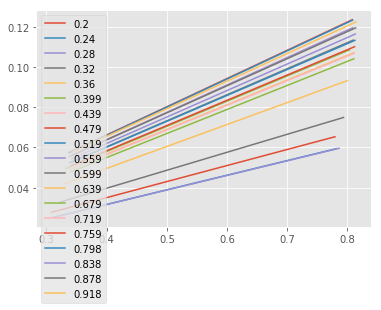

In [126]:
plotTools.plotEachSmilePred(locVolAreskyFormatted, 
                            interpolationBind)
plt.show()

# MC backtest 

#### PDE Backtest

Implement Crank-Nicolson scheme for black-scholes PDE in python within *priceEuropeanCallCranckNicholson* function.

It should return the price and the delta.


We want to solve Black-Scholes PDE with log return $x=\log{S}$ that is we want to find $u$ which solves :
$$u(T,x) = \left( e^x - K \right)^+, x \in \mathbb{R}$$
$$\partial_t u + (b - \frac{\sigma^2}{2}) \partial_x u + \frac{1}{2} \sigma^2 \partial_x^2 u  - b u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

Finite difference methods amounts to bound the domain $\mathcal{O} = [0,T) \times (-\infty,\infty)$ with a bounded one $[0,T) \times (x^-,x^+)$. 
We use dirichlet condition which in the case of european call gives $u(t, x^-) = 0$ and $u(t, x^+) =e^{-b (T-t)} (e^{x^+} - K)$ .

Then we discretize along time axis and space axis and approximate derivatives of $u$ with discrete variations.
Thus we can show for a given time step $h$ and log space step $k$ that we must solve the following linear algebra problem :

$$ \left[ I - h \theta A^k \right] u_{i} = \left[ I - h (1-\theta) A^k \right] u_{i+1} + h \left( \theta w^k(t_i) + (1-\theta) w^k(t_{i+1}) \right)$$
with $u_n^j = \left( e^{\log{S_0} + j k} - K \right)^+ , \forall j \in \mathcal{K}$ a discrete log space discretization.

$A$ is a tridiagonal matrix with $\alpha = \frac{\sigma^2}{2 k^2} - \frac{b}{2k}$ on the lower diagonal, $\gamma = \frac{\sigma^2}{2 k^2} + \frac{b}{2k}$ on the upper diagonal and $\beta = -\left( \frac{\sigma^2}{k^2} + b \right)$ on the main diagonal.
$w_{t_i}$ is a zero vector except the first (upper) element equal $0$ and the last element is equal to $ \gamma e^{-b h (n-i)} (e^{x^+} - K) $.

In the code we note $M^k = \left[ I - h \theta A^k \right]$ and $N^k = \left[ I - h (1-\theta) A^k \right]$.

Cranck Nicholson corresponds to a theta scheme with $\theta=0.5$.
When $\theta=1$ we have the so-call implicit scheme and for $\theta=1$ the explicit scheme.

Cranck-nicholson scheme has the advantage consistent of order two in time and in space.
For $\theta \neq 1/2$ we have only consistency of order one in time and two in space

In constrast with tree, space discretization is the same for each time step.

$$\partial_t u + \left((r_t-q_t) - \frac{\sigma^2 (x,t)}{2} \right) \partial_x u  + \frac{1}{2} \sigma^2 (x,t) \partial_x^2 u  - q_t u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

CFL condition :
$$ h \leq \frac{k^2}{\sigma_{sup}^2 + b_{sup} k^2}$$

Here we choose $k$ as $$2 * \sqrt{\frac{\sigma_{sup}^2 h}{ 1 - b_{sup} h}} $$

where $\sigma_{sup} = \sup\limits_{(x,t) \in \hat{\Theta}}{\sigma_{loc}(e^x,t)}$ and $b_{sup} = \sup\limits_{t \in [0,T]}{(r-q)(t)}$




In [127]:
nbTimeStep = 10#100
nbPaths = 100#100000


In [128]:
importlib.reload(backtest)

<module 'backtest' from './code/backtest.py'>

#### GP Local Volatility

In [130]:
testingDataSetAresky = dataSetConstruction.interpolatedLocalVolatility(locVolAreskyFormatted, 
                                                                       dataSetTest["Price"])

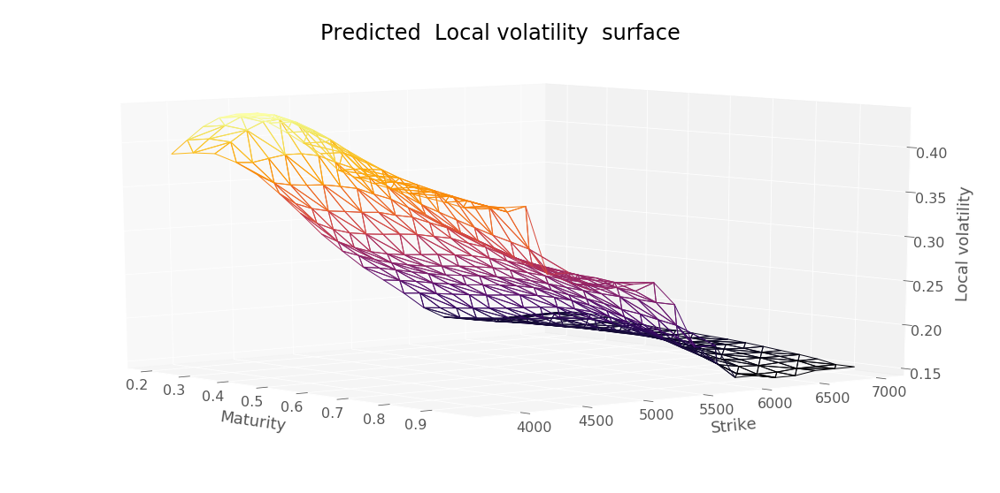

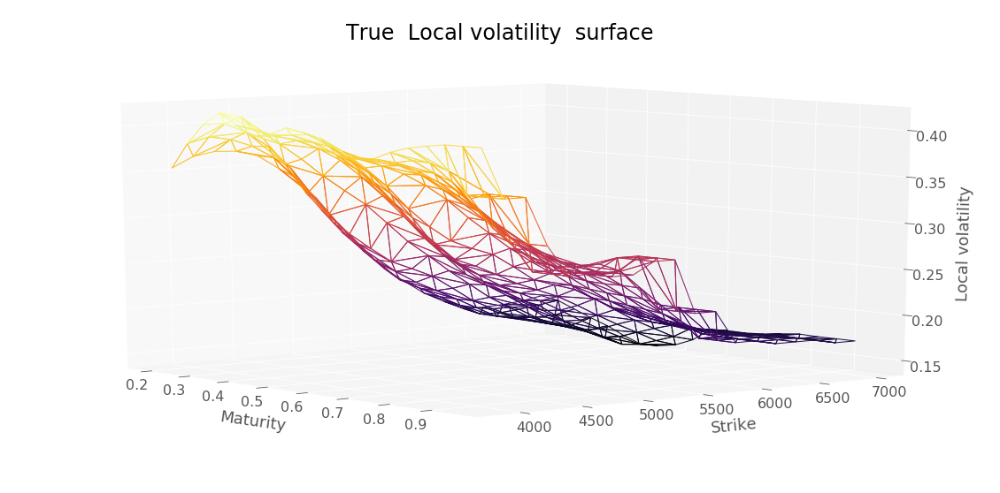

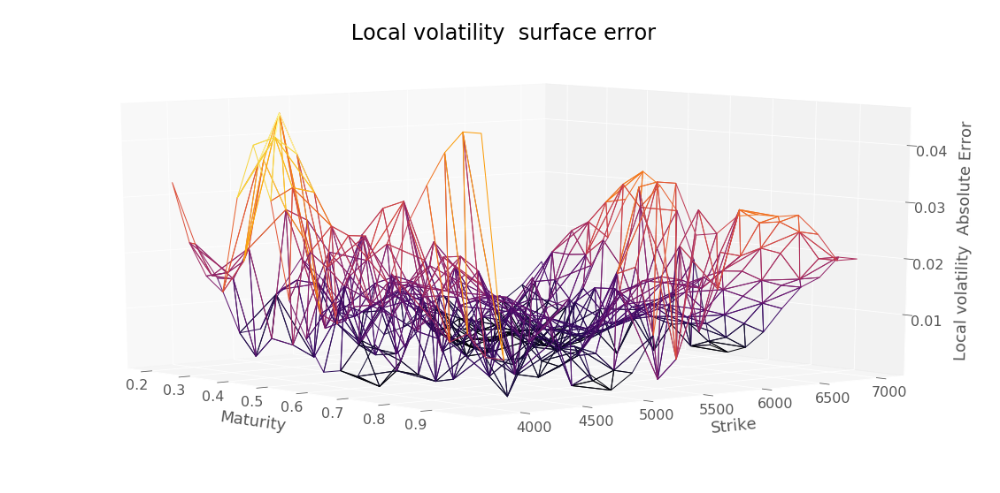

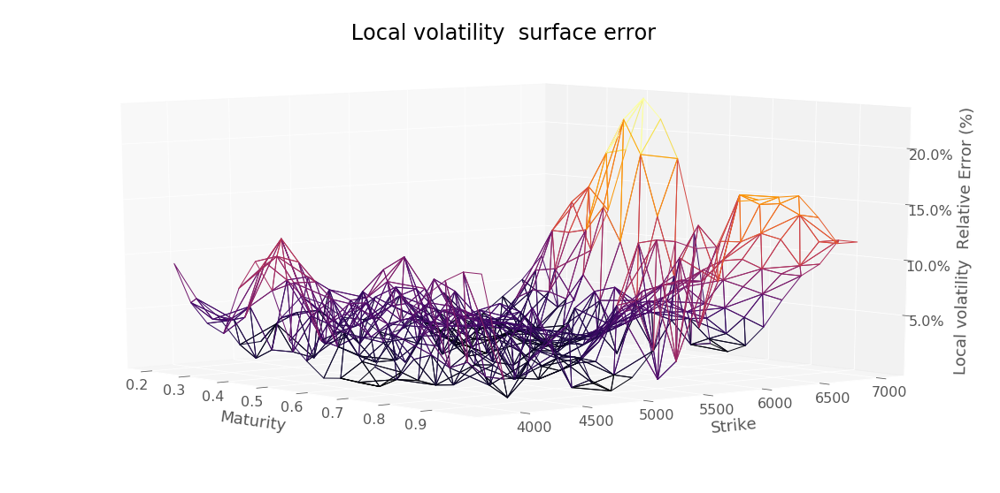

RMSE :  0.01568875310470875


In [105]:
plotTools.predictionDiagnosis(testingDataSetAresky, 
                              dataSetTest["locvol"], 
                              " Local volatility ",
                              yMin=KMin,
                              yMax=KMax)

In [131]:
nnAresky = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolAreskyFormatted["LocalVolatility"], 
                                                               x, 
                                                               y)

In [132]:
mcResSigmaAreskyTest = backtest.MonteCarloPricerVectorized(S0,
                                                           dataSetTest,
                                                           bootstrap,
                                                           nbPaths,
                                                           nbTimeStep,
                                                           nnAresky)
mcResSigmaAreskyTest.head()

Strike  Maturity
1400.0  0.942        6.828676
        0.942        2.818592
1600.0  0.942       21.636344
        0.942        7.328259
1650.0  0.175        0.000000
dtype: float64

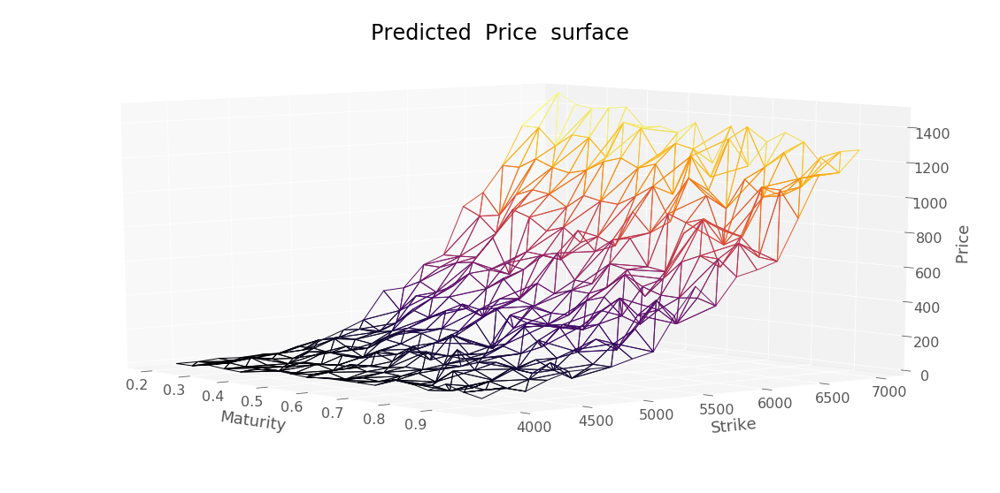

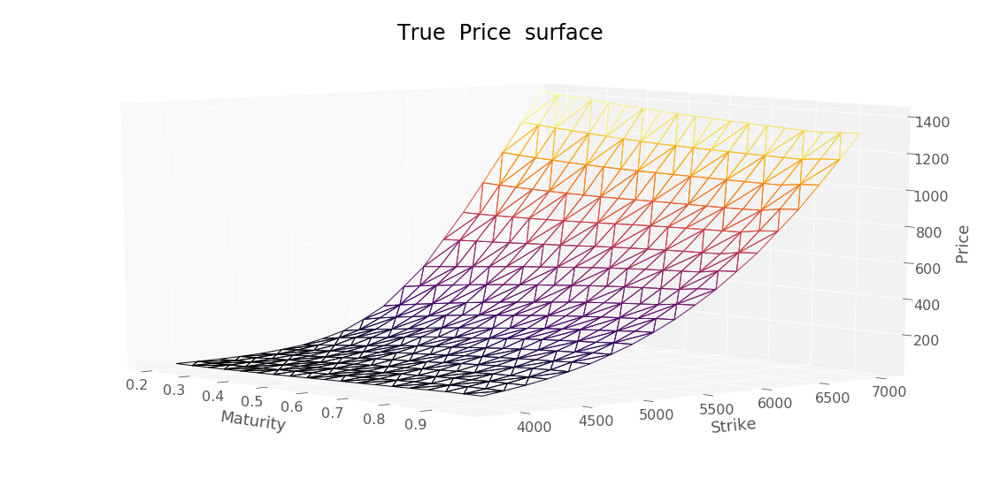

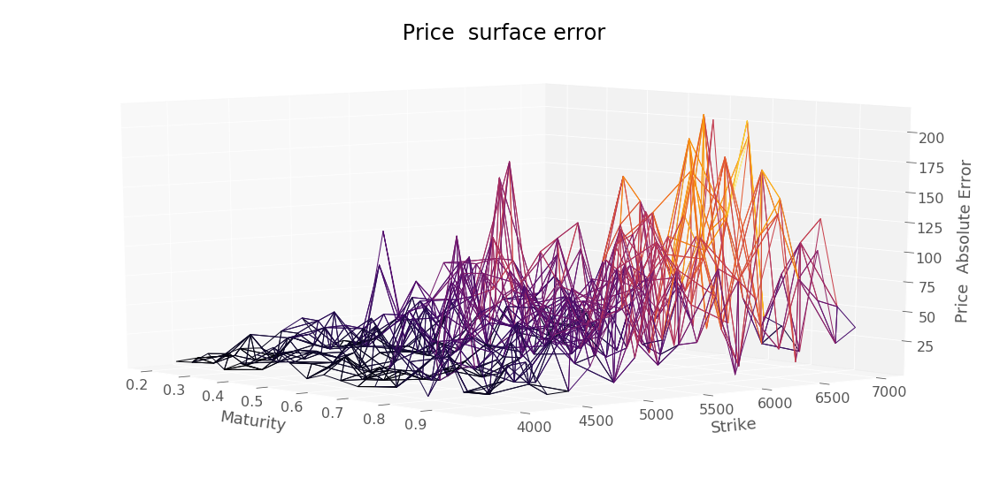

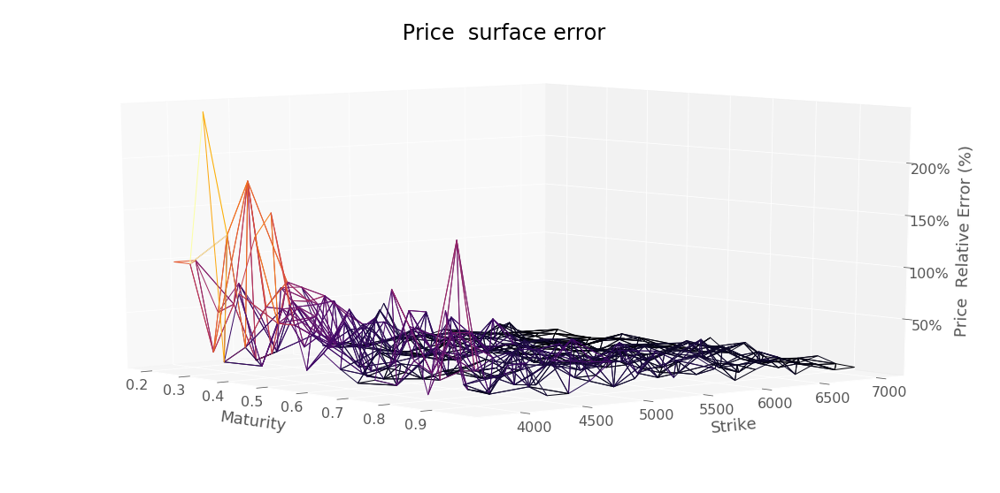

RMSE :  59.52967342339557


In [108]:
plotTools.predictionDiagnosis(mcResSigmaAreskyTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [109]:
mcResSigmaAreskyTest.to_csv(workingFolder + "mcResSigmaAreskyTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [110]:
mcResSigmaAreskyTrain = backtest.MonteCarloPricerVectorized(S0,
                                                            dataSet,
                                                            bootstrap,
                                                            nbPaths,
                                                            nbTimeStep,
                                                            nnAresky)
mcResSigmaAreskyTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       13.893588
        0.866        8.633896
3800    0.118        0.000000
dtype: float64

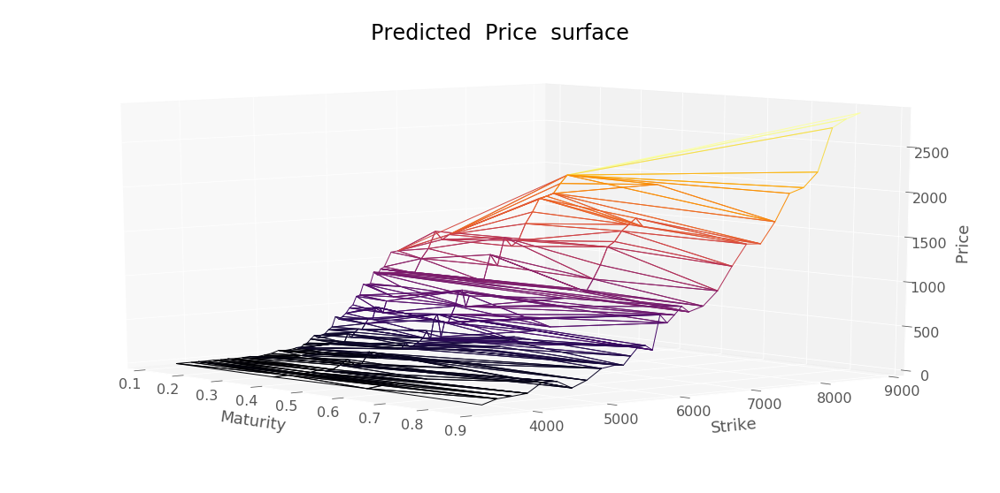

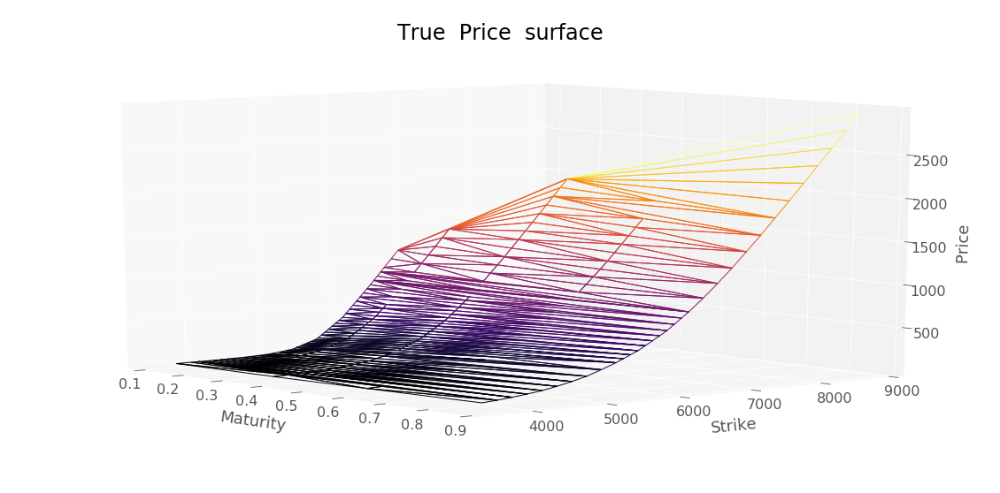

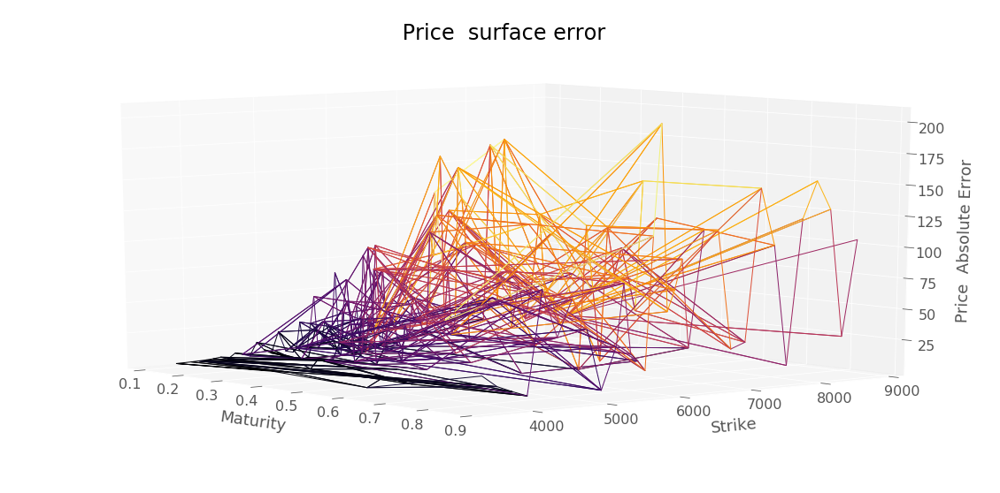

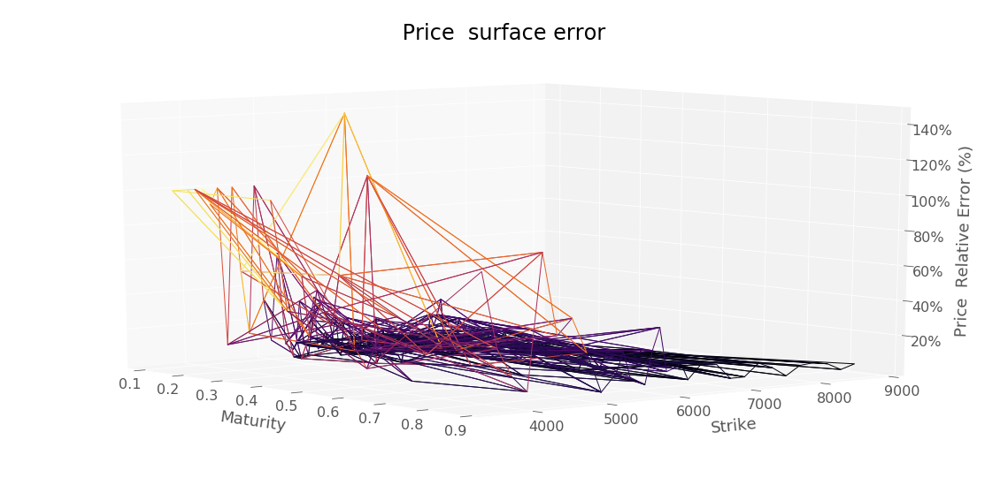

RMSE :  63.03983181447788


In [111]:
plotTools.predictionDiagnosis(mcResSigmaAreskyTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [112]:
mcResSigmaAreskyTrain.to_csv(workingFolder + "mcResSigmaAreskyTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


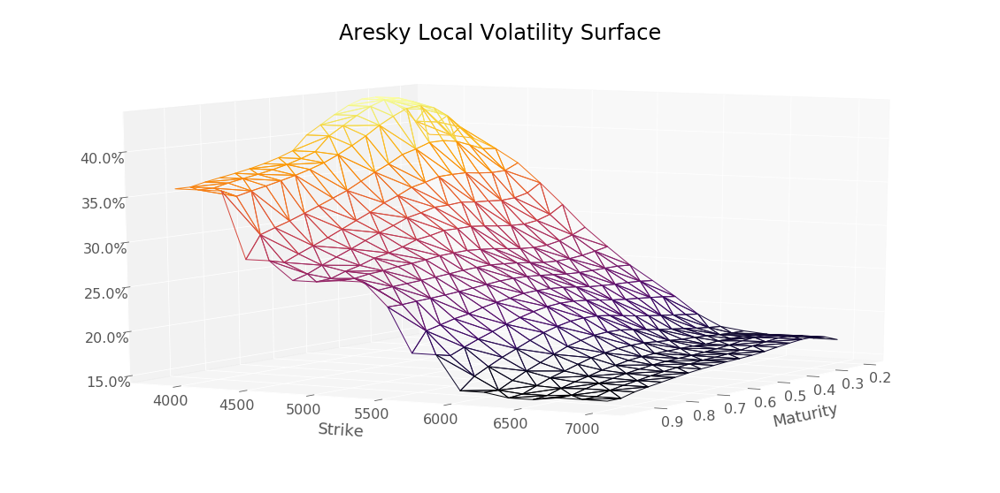

In [113]:
plotTools.plotSerie(testingDataSetAresky[testingDataSetAresky.index.get_level_values("Maturity") > 0.01],
                    Title = 'Aresky Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [114]:
pdeResSigmaAreskyTrain = backtest.PDEPricerVectorized(dataSet, S0, nnAresky, bootstrap)
pdeResSigmaAreskyTrain.head()

Strike  Maturity
3600    0.118        0.024807
        0.367        5.285168
        0.597       18.263646
        0.866       33.739158
3800    0.118        0.092928
dtype: float64

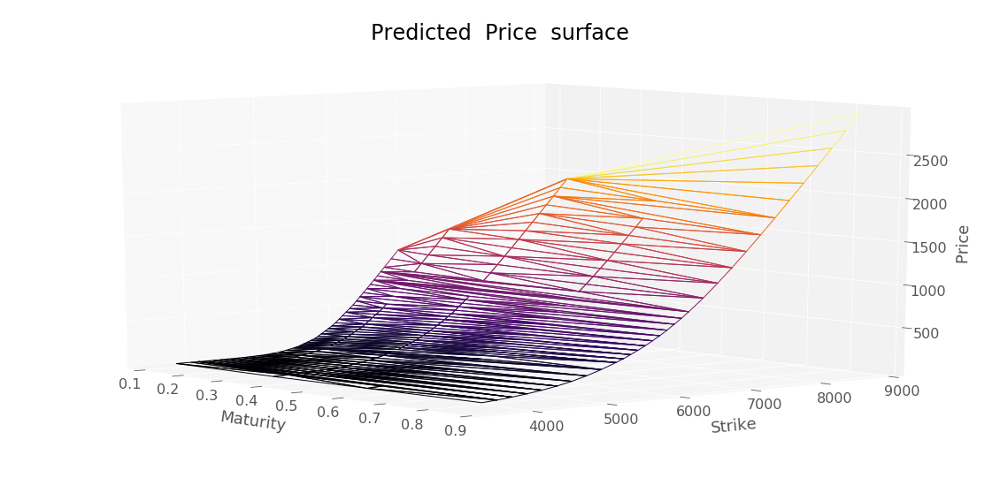

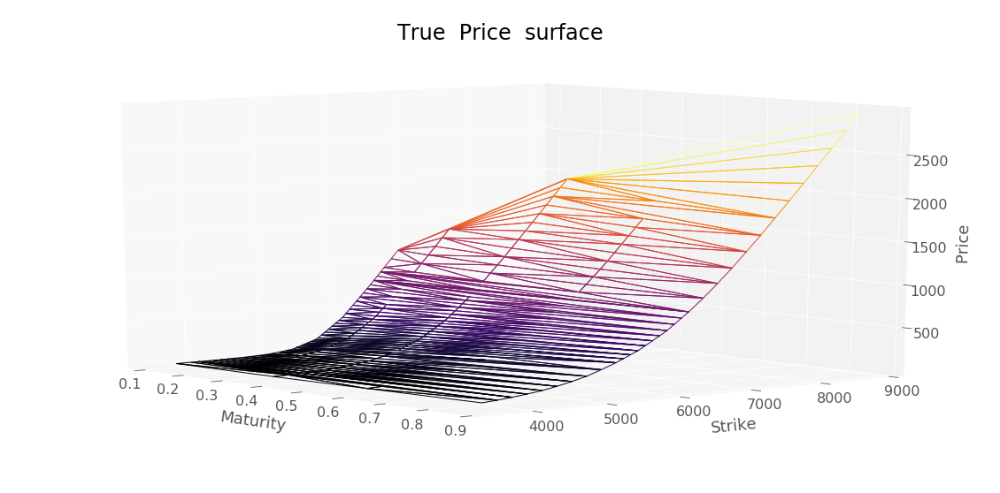

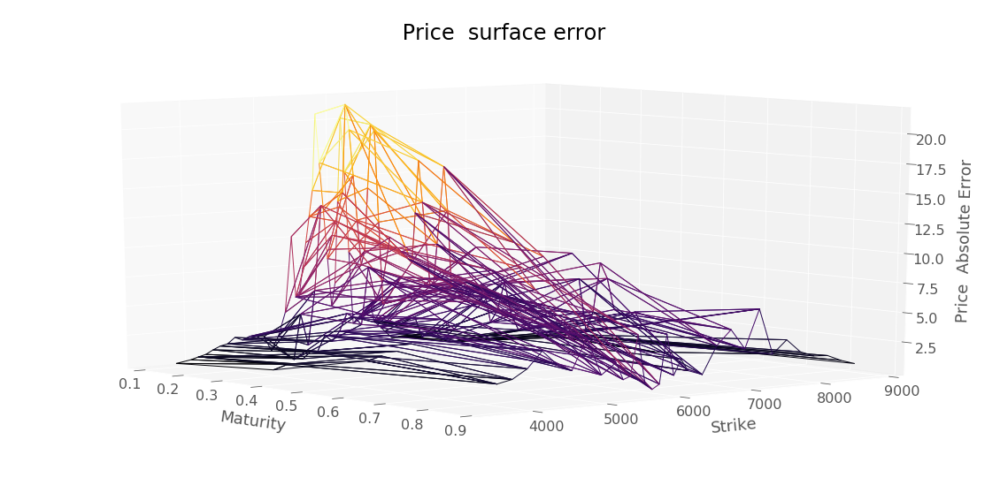

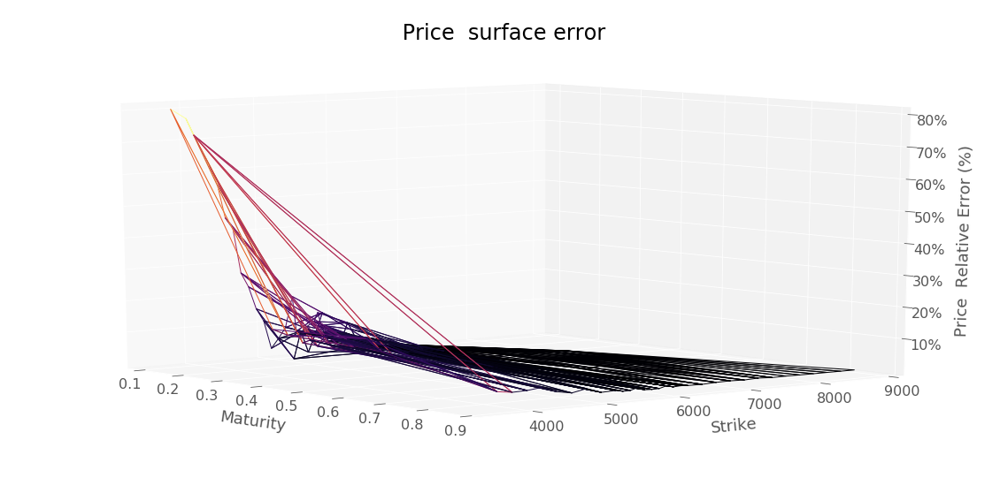

RMSE :  7.527944334447842


In [115]:
plotTools.predictionDiagnosis(pdeResSigmaAreskyTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [116]:
pdeResSigmaAreskyTrain.to_csv(workingFolder + "pdeResSigmaAreskyTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [119]:
pdeResSigmaAreskyTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnAresky, bootstrap)
pdeResSigmaAreskyTest.head()

Strike  Maturity
3858.6  0.200        1.497233
        0.242        2.986239
        0.284        5.150804
        0.326        7.915650
        0.368       11.124222
dtype: float64

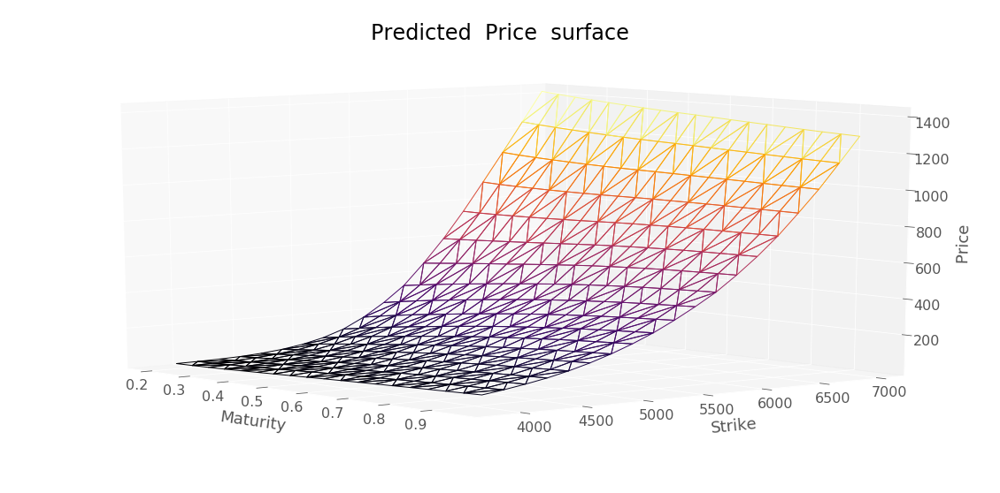

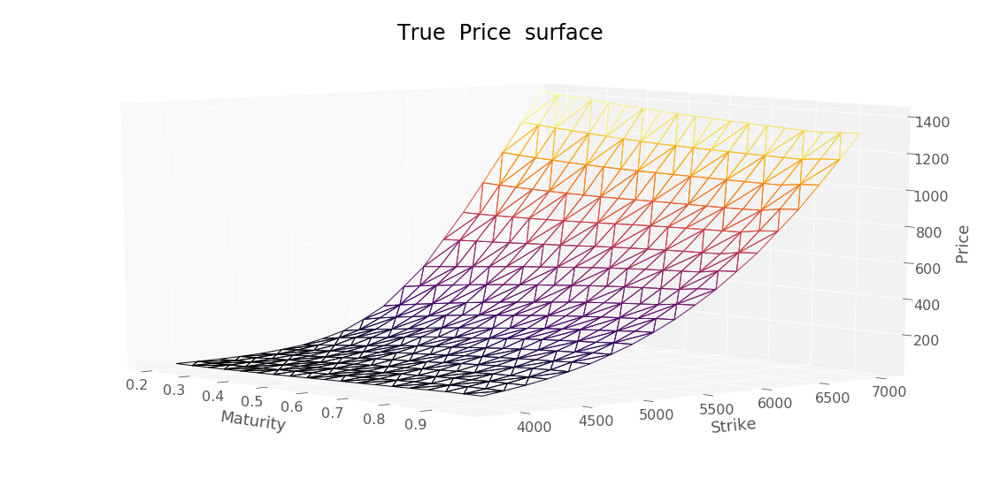

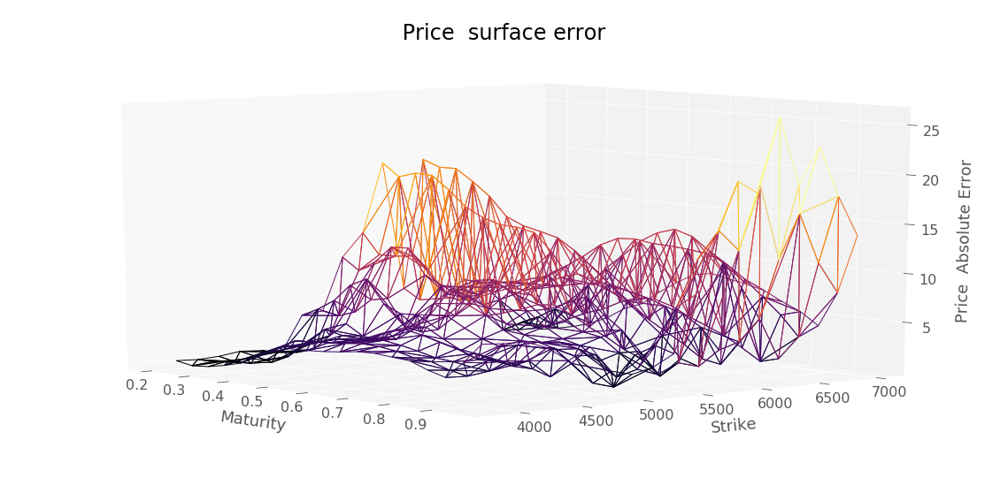

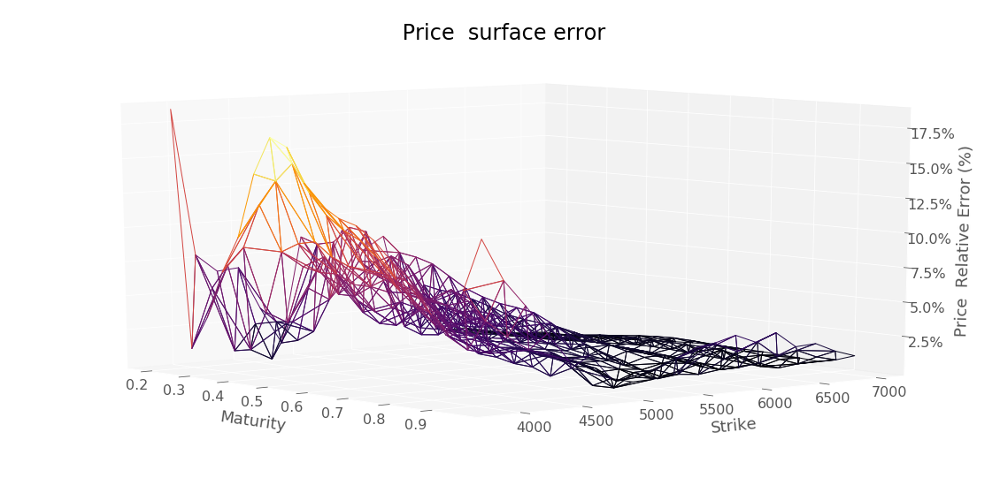

RMSE :  7.493935853415093


In [120]:
plotTools.predictionDiagnosis(pdeResSigmaAreskyTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [121]:
pdeResSigmaAreskyTest.to_csv(workingFolder + "pdeResSigmaAreskyTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


#### Tikhonov calibration

In [122]:
nnVolLocaleTykhonov = lambda x,y : backtest.interpolatedMCLocalVolatility(localVolatility["LocalVolatility"], x, y)


In [123]:
s = testingDataSetAresky.index.get_level_values("Strike").values
t = testingDataSetAresky.index.get_level_values("Maturity").values

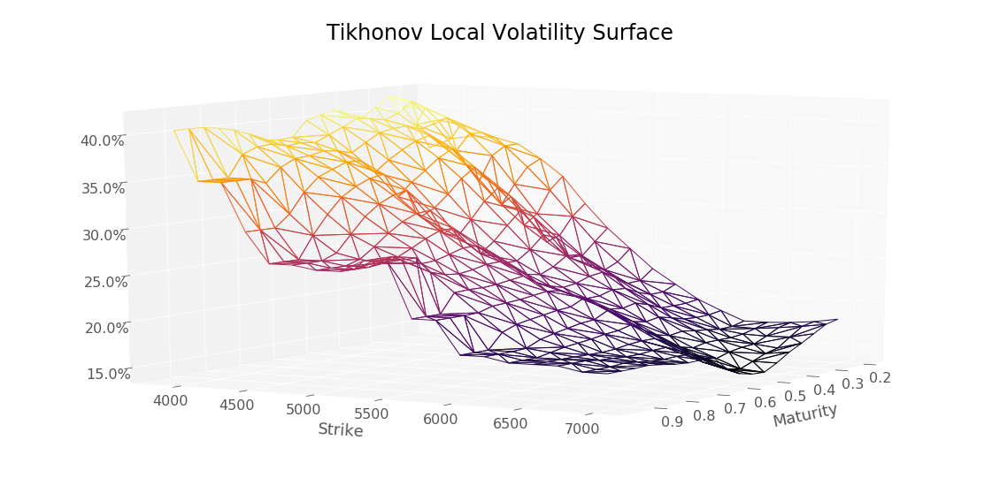

In [124]:
tikhonovLocVol = nnVolLocaleTykhonov(s, t)
plotTools.plotSerie(tikhonovLocVol[tikhonovLocVol.index.get_level_values("Maturity") > 0.01],
                    Title = 'Tikhonov Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [125]:
mcResTikhonovTest = backtest.MonteCarloPricerVectorized(S0,
                                                        dataSetTest,
                                                        bootstrap,
                                                        nbPaths,
                                                        nbTimeStep,
                                                        nnVolLocaleTykhonov)
mcResTikhonovTest.head()

Strike  Maturity
3858.6  0.200        0.568095
        0.242        8.990208
        0.284       10.218066
        0.326        9.116409
        0.368       15.431192
dtype: float64

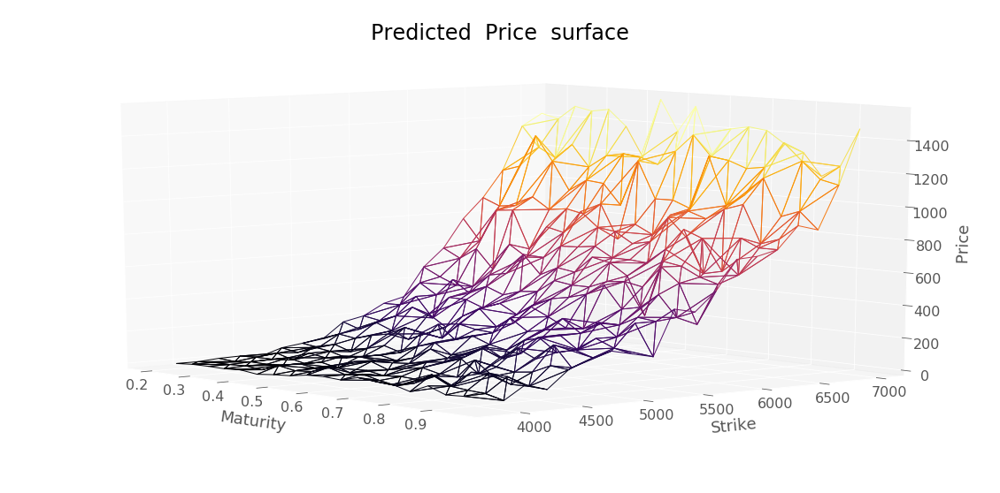

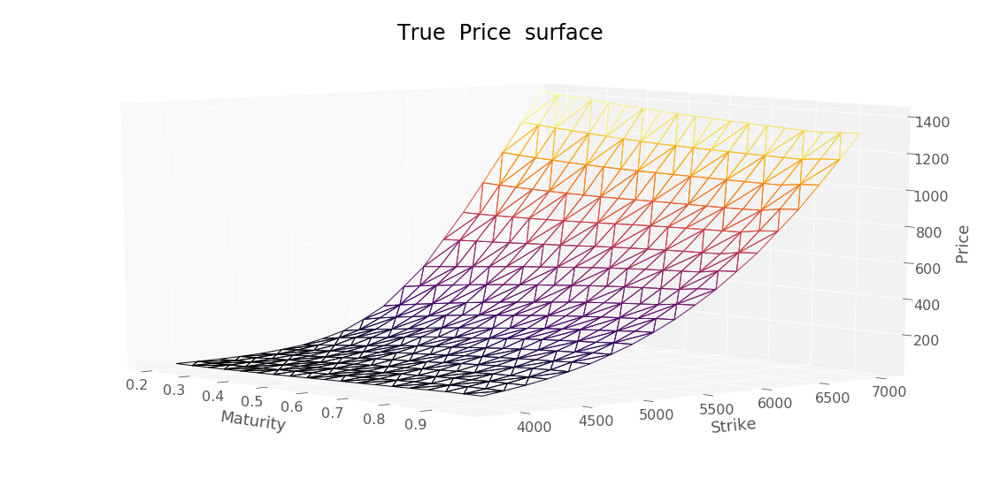

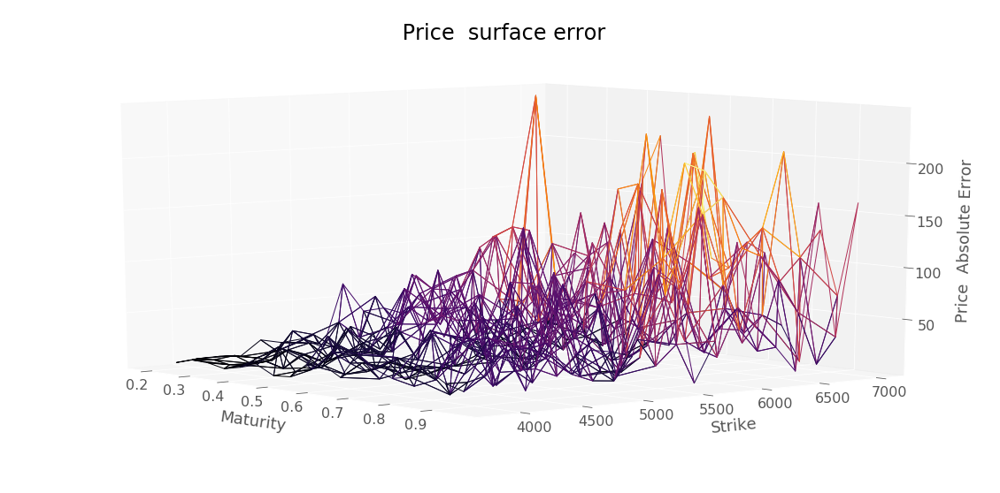

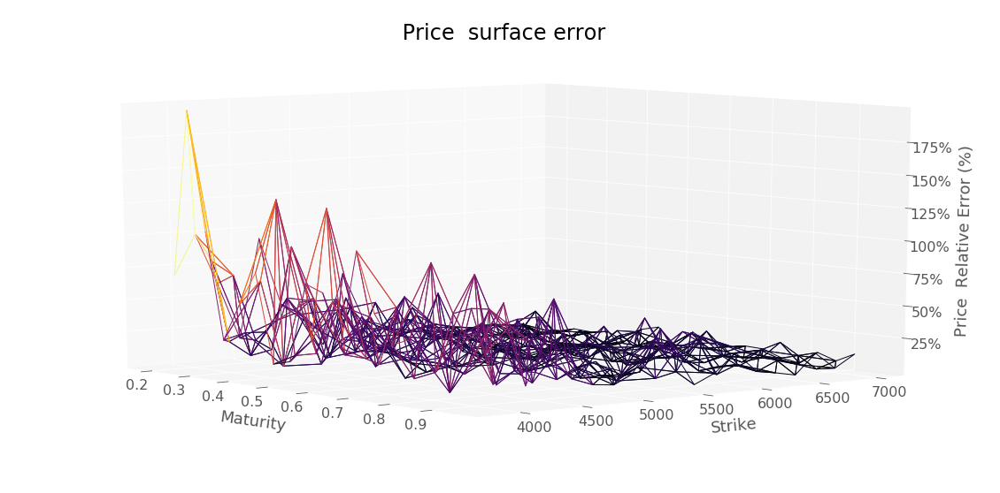

RMSE :  65.35494311648065


In [126]:
plotTools.predictionDiagnosis(mcResTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [127]:
mcResTikhonovTest.to_csv(workingFolder + "mcResTikhonovTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [128]:
mcResTikhonovTrain = backtest.MonteCarloPricerVectorized(S0,
                                                         dataSet,
                                                         bootstrap,
                                                         nbPaths,
                                                         nbTimeStep,
                                                         nnVolLocaleTykhonov)
mcResTikhonovTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       21.634106
        0.866       44.849111
3800    0.118        0.000000
dtype: float64

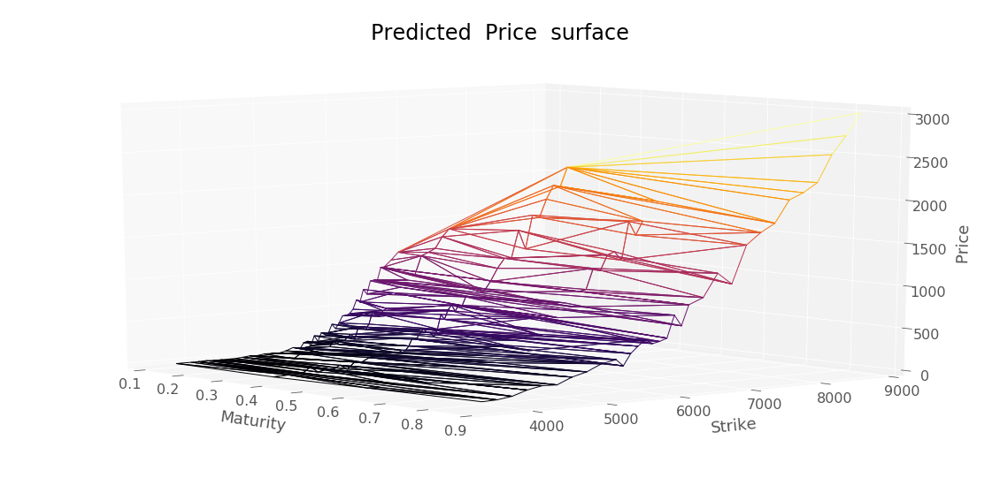

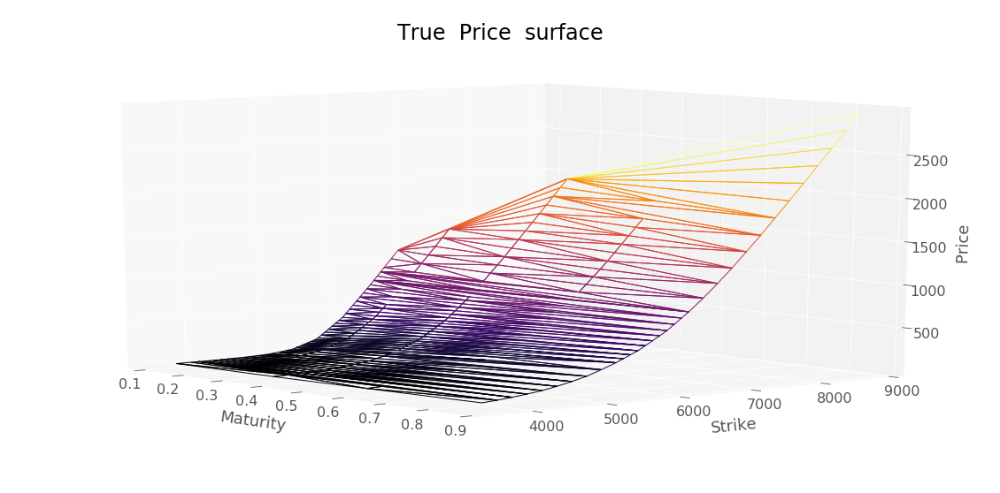

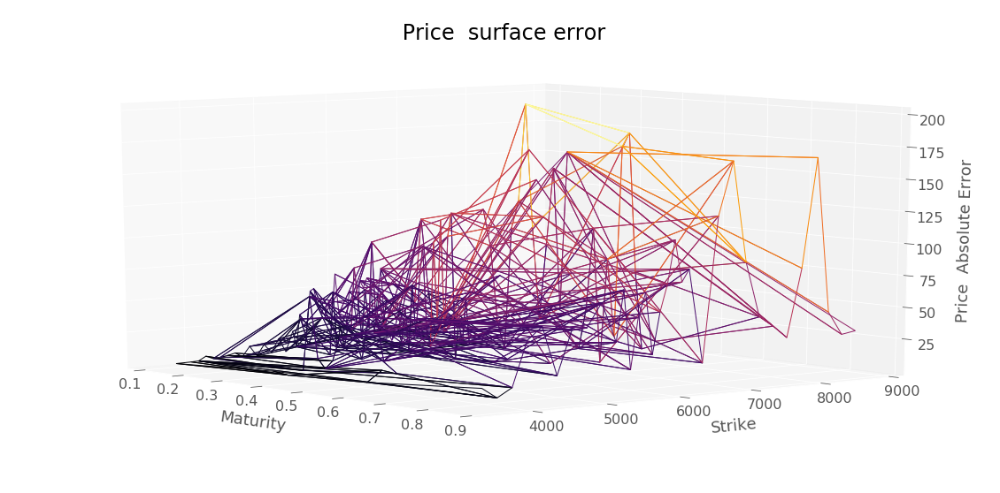

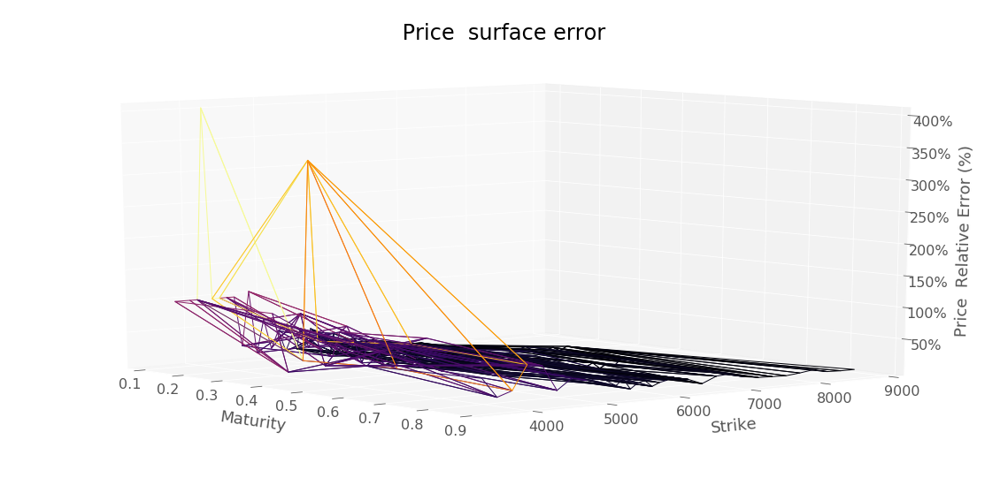

RMSE :  60.993962608159954


In [129]:
plotTools.predictionDiagnosis(mcResTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [130]:
mcResTikhonovTrain.to_csv(workingFolder + "mcResTikhonovTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [131]:
pdeResSigmaTikhonovTrain = backtest.PDEPricerVectorized(dataSet, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTrain.head()

KeyboardInterrupt: 

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTrain.to_csv(workingFolder + "pdeResSigmaTikhonovTrain.csv")

In [ ]:
pdeResSigmaTikhonovTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTest.to_csv(workingFolder + "pdeResSigmaTikhonovTest.csv")

#### Backtest Local volatility SSVI 

In [ ]:
nnSSVI = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVIDf["LocalVolatility"], x, y)

In [ ]:
mcResSSVITest = backtest.MonteCarloPricerVectorized(S0,
                                                    dataSetTest,
                                                    bootstrap,
                                                    nbPaths,
                                                    nbTimeStep,
                                                    nnSSVI)
mcResSSVITest.head()

In [ ]:
mcResSSVITest.to_csv(workingFolder + "mcResSSVITest.csv")

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITrain = backtest.MonteCarloPricerVectorized(S0,
                                                     dataSet,
                                                     bootstrap,
                                                     nbPaths,
                                                     nbTimeStep,
                                                     nnSSVI)
mcResSSVITrain.head()

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITrain.to_csv(workingFolder + "mcResSSVITrain.csv")

In [ ]:
testingDataSetSSVI = backtest.interpolatedLocalVolatility(locVolSSVIDf, testingDataSet["Price"])

In [ ]:
plotTools.plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
                    Title = 'SSVI Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [ ]:
pdeResSigmaSSVITrain = backtest.PDEPricerVectorized(dataSet, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITrain.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITrain.to_csv(workingFolder + "pdeResSigmaSSVITrain.csv")

In [ ]:
pdeResSigmaSSVITest = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest.to_csv(workingFolder + "pdeResSigmaSSVITest.csv")

#### Compute errors

In [ ]:
PriceconvexSoftGatheralVolModelTrain = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTrain.csv", 
                                                             parseHeader=0)
PriceconvexSoftGatheralVolModelTrain.head()

In [ ]:
mcResSSVITrain = backtest.loadMCPrices("mcResSSVITrain.csv")
mcResSSVITrain.head()

In [ ]:
backtest.rmse(mcResSSVITrain[2], dataSet["Price"])

In [ ]:
mcResTikhonovTrain = backtest.loadMCPrices("mcResTikhonovTrain.csv")
mcResTikhonovTrain.head()

In [ ]:
backtest.rmse(mcResTikhonovTrain[2], dataSet["Price"])

In [ ]:
mcResSigmaAreskyTrain = backtest.loadMCPrices("mcResSigmaAreskyTrain.csv")
mcResSigmaAreskyTrain.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTrain[2], dataSet["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Train = backtest.loadMCPrices("mcResVolLocale7Train.csv",parseHeader=0)
mcResVolLocale7Train.head()

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
#Grid test
mcResVolLocale8Train = backtest.loadMCPrices("mcResVolLocale8Train.csv",parseHeader=0)
mcResVolLocale8Train.head()

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
PriceconvexSoftGatheralVolModelTest = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTest.csv", 
                                                            parseHeader=0)
PriceconvexSoftGatheralVolModelTest.head()

In [ ]:
mcResSSVITest = backtest.loadMCPrices("mcResSSVITest.csv")
mcResSSVITest.head()

In [ ]:
backtest.rmse(mcResSSVITest[2], dataSetTest["Price"])

In [ ]:
mcResTikhonovTest = backtest.loadMCPrices("mcResTikhonovTest.csv")
mcResTikhonovTest.head()

In [ ]:
backtest.rmse(mcResTikhonovTest[2], dataSetTest["Price"])

In [ ]:
mcResSigmaAreskyTest = backtest.loadMCPrices("mcResSigmaAreskyTest.csv")
mcResSigmaAreskyTest.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTest[2], dataSetTest["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Test = backtest.loadMCPrices("mcResVolLocale7Test.csv",parseHeader=0)
mcResVolLocale7Test.head()

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])

In [ ]:
#Grid test
mcResVolLocale8Test = backtest.loadMCPrices("mcResVolLocale8Test.csv",parseHeader=0)
mcResVolLocale8Test.head()

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])